**Projet 6 : Classifiez automatiquement des biens de consommation**

**Etude de faisabilité du moteur de classification**

Votre mission est de réaliser une première étude de faisabilité d'un moteur de classification d'articles basé sur une image et une description pour l'automatisation de l'attribution de la catégorie de l'article.

Vous analyserez le jeu de données en réalisant un prétraitement des images et des descriptions des produits, une réduction de dimension, puis un clustering. Les résultats du clustering seront présentés sous la forme d’une représentation en deux dimensions à déterminer, qui ’illustrera le fait que les caractéristiques extraites permettent de regrouper des produits de même catégorie.

La représentation graphique vous aidera à convaincre Linda que cette approche de modélisation permettra bien de regrouper des produits de même catégorie.

**Contraintes**

Linda vous a communiqué les contraintes suivantes :

* Afin d’extraire les features, mettre en œuvre a minima un algorithme de type SIFT / ORB / SURF.
* Un algorithme de type CNN Transfer Learning peut éventuellement être utilisé en complément, s’il peut apporter un éclairage supplémentaire à la démonstration.


# Chargement et nettoyage

**Imports**

In [1]:
!pip install opencv-contrib-python
!pip install tensorflow

import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import tensorflow as tf


pd.options.display.max_rows = 999

from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import NMF, LatentDirichletAllocation
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

from string import punctuation
from nltk.corpus import stopwords
from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer 
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import VGG16

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Flatten, Dense, Activation
from keras.models import clone_model

from ipywidgets import IntProgress
from ipywidgets import Text
from IPython.display import display
from IPython.display import Image

from scipy.ndimage import gaussian_filter
from PIL import Image as Image_PIL

import time


  Preparing metadata (setup.py) ... - done
  Created wheel for wrapt: filename=wrapt-1.12.1-cp37-cp37m-linux_x86_64.whl size=77049 sha256=f5dfa29ce3241fe4691ab10681c72e1ba063cc78a8f165f27613fbe2b25ac23a
  Stored in directory: /root/.cache/pip/wheels/62/76/4c/aa25851149f3f6d9785f6c869387ad82b3fd37582fa8147ac6
Successfully built wrapt
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 3.10.0.2
    Uninstalling typing-extensions-3.10.0.2:
      Successfully uninstalled typing-extensions-3.10.0.2
  Attempting uninstall: six
    Found existing installation: six 1.16.0
    Uninstalling six-1.16.0:
      Successfully uninstalled six-1.16.0
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.13.3
    Uninstalling wrapt-1.13.3:
      Successfully uninstalled wrapt-1.13.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency 

In [2]:
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df


def import_data(file):
    """create a dataframe and optimize its memory usage"""
    df = pd.read_csv(file, parse_dates=True, keep_date_col=True)
    df = reduce_mem_usage(df)
    return df

In [3]:
images = [cv2.imread(file) for file in glob.glob("/kaggle/input/dataset-flipkart/Flipkart/Images/*.jpg")]
len(images)

1050

In [4]:
from IPython.display import Image

images_list =[Image(file) for file in glob.glob("/kaggle/input/dataset-flipkart/Flipkart/Images/*.jpg")]
len(images_list)

1050

In [5]:
data = pd.read_csv('/kaggle/input/flipkart-sample/flipkart_com-ecommerce_sample_1050.csv')

In [6]:
data.shape

(1050, 15)

In [7]:
data.sample(3)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
619,4e5ebfc871992e7e22365c0c036a1b89,2016-03-16 23:37:14 +0000,http://www.flipkart.com/fs-mini-klub-baby-boy-...,FS Mini Klub Baby Boy's Bodysuit,"[""Baby Care >> Infant Wear >> Baby Boys' Cloth...",BOLEFYQHHXVPYJH2,849.0,849.0,4e5ebfc871992e7e22365c0c036a1b89.jpg,False,Key Features of FS Mini Klub Baby Boy's Bodysu...,No rating available,No rating available,FS Mini Klub,"{""product_specification""=>[{""key""=>""Sleeve"", ""..."
278,553aa0252537751d153e7c50029f0242,2016-04-24 18:34:50 +0000,http://www.flipkart.com/adino-adf04-analog-wat...,Adino ADF04 Analog Watch - For Girls,"[""Watches >> Wrist Watches >> Adino Wrist Watc...",WATEHYMDBDZAYJ4E,1099.0,719.0,553aa0252537751d153e7c50029f0242.jpg,False,Specifications of Adino ADF04 Analog Watch - ...,No rating available,No rating available,Adino,"{""product_specification""=>[{""key""=>""Type"", ""va..."
563,e15195f2a5ebaa2168ccd65324e65e8e,2016-01-07 05:50:25 +0000,http://www.flipkart.com/fluid-fs201-bl01-analo...,Fluid FS201-BL01 Analog-Digital Watch - For W...,"[""Watches >> Wrist Watches >> Fluid Wrist Watc...",WATDUK7DKS6AJZYK,999.0,999.0,e15195f2a5ebaa2168ccd65324e65e8e.jpg,True,Fluid FS201-BL01 Analog-Digital Watch - For W...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Other Func..."


In [8]:
data.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

**Nettoyage catégories**

In [9]:
data['product_category_tree'].nunique()

642

In [10]:
#Traitement des catégories
def split_categories(category, level):
    '''Fonction qui affiche les '''
    category = category.split('["')[1].split('"]')[0]
    cat = category.split(' >> ')
    if(len(cat)) < 3:
        cat = [cat[0], cat[1], 'None']
        if(len(cat))<2:
            cat = [cat[0], 'None', 'None']
    return cat[level]

def split_categories_1(category):
    return split_categories(category,0)
def split_categories_2(category):
    return split_categories(category,1)
def split_categories_3(category):
    return split_categories(category,2)

def detail_categories(dataframe):
    dataframe['cat_lvl_1'] = dataframe['product_category_tree'].apply(split_categories_1)
    dataframe['cat_lvl_2'] = dataframe['product_category_tree'].apply(split_categories_2)
    dataframe['cat_lvl_3'] = dataframe['product_category_tree'].apply(split_categories_3)
    return dataframe.drop(['product_category_tree'], axis=1)

In [11]:
data = detail_categories(data)

In [12]:
data.sample(3)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
645,31376e77d4621c06a45440d42b9fe2ac,2016-04-29 11:45:32 +0000,http://www.flipkart.com/needybee-baby-girl-s-l...,NeedyBee Baby Girl's Layered Dress,DREEGYPSYD23Y8CV,1600.0,1600.0,31376e77d4621c06a45440d42b9fe2ac.jpg,False,Specifications of NeedyBee Baby Girl's Layered...,No rating available,No rating available,NeedyBee,"{""product_specification""=>[{""value""=>""1 Dress""...",Baby Care,Infant Wear,Baby Girls' Clothes
632,96bc1fbb83ad5a2c0441d132fe8bcf97,2016-06-07 14:06:00 +0000,http://www.flipkart.com/lilliput-solid-baby-bo...,Lilliput Solid Baby Boy's Blue Cargo Shorts,SRTEGHDFSZFWPHZG,1445.0,867.0,96bc1fbb83ad5a2c0441d132fe8bcf97.jpg,False,Key Features of Lilliput Solid Baby Boy's Blue...,No rating available,No rating available,Lilliput,"{""product_specification""=>[{""key""=>""Fabric"", ""...",Baby Care,Infant Wear,Baby Boys' Clothes
587,6b04c746cac2aa811d7a8753e54dc96e,2016-01-07 05:50:25 +0000,http://www.flipkart.com/maxima-07034lmli-attiv...,Maxima 07034LMLI Attivo Analog Watch - For Women,WATDYFQ557AP8EVM,675.0,641.0,6b04c746cac2aa811d7a8753e54dc96e.jpg,False,Maxima 07034LMLI Attivo Analog Watch - For Wo...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va...",Watches,Wrist Watches,Maxima Wrist Watches


In [13]:
data.groupby('cat_lvl_1').count()['uniq_id'].sort_values(ascending=False)

cat_lvl_1
Baby Care                     150
Beauty and Personal Care      150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Kitchen & Dining              150
Watches                       150
Name: uniq_id, dtype: int64

In [14]:
data.groupby('cat_lvl_2').count()['uniq_id'].sort_values(ascending=False)

cat_lvl_2
Wrist Watches                      149
Laptop Accessories                  87
Infant Wear                         84
Coffee Mugs                         74
Showpieces                          71
Bed Linen                           65
Fragrances                          65
Network Components                  49
Cookware                            27
Table Decor & Handicrafts           27
Combos and Kits                     24
Wall Decor & Clocks                 22
Bath Linen                          21
Curtains & Accessories              19
Makeup                              18
Baby & Kids Gifts                   15
Body and Skin Care                  15
Baby Bedding                        15
Baby Bath & Skin                    14
Decorative Lighting & Lamps         14
Kitchen Tools                       14
Kitchen & Dining Linen              14
Containers & Bottles                13
Cushions, Pillows & Covers          13
Hair Care                            9
Feeding & Nursi

In [15]:
data.groupby('cat_lvl_3').count()['uniq_id'].sort_values(ascending=False)

cat_lvl_3
Deodorants                                             65
Blankets, Quilts & Dohars                              57
Baby Girls' Clothes                                    49
Routers                                                49
USB Gadgets                                            38
Baby Boys' Clothes                                     35
Ethnic                                                 34
Prithish Coffee Mugs                                   26
Pots & Pans                                            24
Maxima Wrist Watches                                   23
Showpieces                                             23
Rockmantra Coffee Mugs                                 22
Batteries                                              22
Sonata Wrist Watches                                   19
Curtains                                               19
Towels                                                 19
Printland Coffee Mugs                                  13
Kitc

In [16]:
data.to_csv('data_saved_data_categories.csv',sep=',',index = True)

In [17]:
#Identification des catégories les moins représentées
occurence_cat = pd.DataFrame(data['cat_lvl_2'].value_counts())

In [18]:
occurence_cat.head()

,cat_lvl_2
Wrist Watches,149
Laptop Accessories,87
Infant Wear,84
Coffee Mugs,74
Showpieces,71


In [19]:
#identification des catégories pour lesquelles on a le moins d'occurence
cat_to_fill = occurence_cat[occurence_cat['cat_lvl_2']<10]
cat_to_fill.sample(5)

,cat_lvl_2
Lighting,7
Clocks,1
Bath and Spa,7
Kripa's Home Furnishing,1
Baby Grooming,4


# Préparation des données

In [20]:
from sklearn.model_selection import train_test_split

In [21]:
train, test = train_test_split(data.sample(100, random_state=42), test_size = 0.25, random_state=42)
train, test = train_test_split(data, test_size = 0.25, random_state=42)


In [22]:
train.to_csv('data_saved_train.csv')
test.to_csv('data_saved_test.csv')

In [23]:
train.head(10)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
165,785b4383b12106dd172306d427d8f7b2,2015-12-01 12:40:44 +0000,http://www.flipkart.com/rockmantra-cute-two-ca...,Rockmantra Cute Two Cats Ceramic Mug,MUGEAGGKFBTYPN4Z,499.0,349.0,785b4383b12106dd172306d427d8f7b2.jpg,False,Rockmantra Cute Two Cats Ceramic Mug (5.5 l)\r...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va...",Kitchen & Dining,Coffee Mugs,Rockmantra Coffee Mugs
248,45d0af2c709de47268c80c35a117de44,2015-12-01 12:40:44 +0000,http://www.flipkart.com/malhar-niko-male-doll-...,Malhar Niko Male Doll Showpiece - 25 cm,SHIEY382SR75SXEY,6395.0,5436.0,45d0af2c709de47268c80c35a117de44.jpg,True,Buy Malhar Niko Male Doll Showpiece - 25 cm ...,No rating available,No rating available,Malhar,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Decor & Festive Needs,Showpieces,Malhar Showpieces
310,64b463dc0b75ae40a848498c657041e6,2015-12-01 06:13:00 +0000,http://www.flipkart.com/linksys-smart-wi-fi-ro...,Linksys Smart Wi-Fi Router,RTRDZTF9DBT4CW8U,14999.0,13500.0,64b463dc0b75ae40a848498c657041e6.jpg,True,Buy Linksys Smart Wi-Fi Router only for Rs. 0....,No rating available,No rating available,Linksys,"{""product_specification""=>[{""key""=>""Encryption...",Computers,Network Components,Routers
685,6b5cdfe68595fbcab0e05dc625d3d66a,2015-12-31 09:19:31 +0000,http://www.flipkart.com/richfeel-sunshield-spf...,Richfeel Sunshield - SPF 30 PA++,SNRE4F2GBWVF6UKR,299.0,224.0,6b5cdfe68595fbcab0e05dc625d3d66a.jpg,False,Flipkart.com: Buy Richfeel Sunshield - SPF 30 ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Quantity"",...",Beauty and Personal Care,Body and Skin Care,Face Care
843,e86daf9ebcdfc5c5dd088cdb7f8f8db6,2015-12-29 05:07:38 +0000,http://www.flipkart.com/epresent-mfan-1-fan-us...,Epresent Mfan 1 Fan USB USB Fan,USGEB3HTYWCYT2HY,269.0,219.0,e86daf9ebcdfc5c5dd088cdb7f8f8db6.jpg,False,Buy Epresent Mfan 1 Fan USB USB Fan for Rs.219...,No rating available,No rating available,Epresent,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Computers,Laptop Accessories,USB Gadgets
342,17a73d7c4b02ada2bfeed1115fed08a4,2015-12-01 06:13:00 +0000,http://www.flipkart.com/envy-1000-force-combo-...,Envy-1000 Force Combo Set,CAGE79CEHJZX52XS,360.0,329.0,17a73d7c4b02ada2bfeed1115fed08a4.jpg,False,Flipkart.com: Buy Envy-1000 Force Combo Set on...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Number of ...",Beauty and Personal Care,Fragrances,Deodorants
605,bcb8e456728013a90ba66ab3b1b783ad,2016-01-07 04:32:43 +0000,http://www.flipkart.com/hp-15-ac121tu-notebook...,HP 15-ac121tu (Notebook) (Core i3 (5th Gen)/ 4...,COMEAZ94HWYQTZHZ,35390.0,35390.0,bcb8e456728013a90ba66ab3b1b783ad.jpg,True,Buy HP 15-ac121tu (Notebook) (Core i3 (5th Gen...,4.5,4.5,HP,"{""product_specification""=>[{""key""=>""Included S...",Computers,Laptops,HP Laptops
526,9059227d71995f88a1f48ff63830f716,2016-01-07 05:50:25 +0000,http://www.flipkart.com/fluid-fu203-gr01-analo...,Fluid FU203-GR01 Analog-Digital Watch - For Men,WATDUK7DV6GSTKRD,899.0,899.0,9059227d71995f88a1f48ff63830f716.jpg,True,Fluid FU203-GR01 Analog-Digital Watch - For M...,3,3,NaN,"{""product_specification""=>[{""key""=>""Other Func...",Watches,Wrist Watches,Fluid Wrist Watches
65,2baa415ebcc4fe563ce13b50e60efc1c,2016-06-10 21:33:30 +0000,http://www.flipkart.com/shopmania-happy-birthd...,Shopmania Happy Birthday Gift For Starting Let...,MUGEJG6TBVQSYMUP,449.0,225.0,2baa415ebcc4fe563ce13b50e60efc1c.jpg,False,Key Features of Shopmania Happy Birthday Gift ...,No rating available,No rating available,Shopmania,"{""product_specification""=>[{""key""=>""Type"", ""va...",Kitchen & Dining,Coffee Mugs,Shopmania Coffee Mugs
631,e40e9b4ae48e452dc407d299b467d0c3,2016-06-07 1

In [24]:
pd.read_csv('/kaggle/input/flipkart-sample/flipkart_com-ecommerce_sample_1050.csv').iloc[165]

uniq_id                                     785b4383b12106dd172306d427d8f7b2
crawl_timestamp                                    2015-12-01 12:40:44 +0000
product_url                http://www.flipkart.com/rockmantra-cute-two-ca...
product_name                            Rockmantra Cute Two Cats Ceramic Mug
product_category_tree      ["Kitchen & Dining >> Coffee Mugs >> Rockmantr...
pid                                                         MUGEAGGKFBTYPN4Z
retail_price                                                           499.0
discounted_price                                                       349.0
image                                   785b4383b12106dd172306d427d8f7b2.jpg
is_FK_Advantage_product                                                False
description                Rockmantra Cute Two Cats Ceramic Mug (5.5 l)\r...
product_rating                                           No rating available
overall_rating                                           No rating available

# Données textuelles

## Traitement des descriptions (BoW / TF IDF)

In [25]:
train[['description']].sample(5)

,description
1040,Buy Elite Collection Medium Acrylic Sticker fo...
263,Buy Woodino Handicrafts Showpiece - 6.5 cm f...
600,Key Features of R&Mshoppee MDF Wall Shelf Tren...
476,"Cotonex Black, White Cotton Kitchen Linen Set ..."
469,Key Features of Ocean CPGW087 Pack of 6 Multip...


### TF IDF

In [26]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [27]:
from string import punctuation
from nltk.corpus import stopwords
stopwords_en = set(["a","a's","able","about","above","according","accordingly","across","actually","after","afterwards","again","against","ain't","all","allow","allows","almost","alone","along","already","also","although","always","am","among","amongst","an","and","another","any","anybody","anyhow","anyone","anything","anyway","anyways","anywhere","apart","appear","appreciate","appropriate","are","aren't","around","as","aside","ask","asking","associated","at","available","away","awfully","b","be","became","because","become","becomes","becoming","been","before","beforehand","behind","being","believe","below","beside","besides","best","better","between","beyond","both","brief","but","by","c","c'mon","c's","came","can","can't","cannot","cant","cause","causes","certain","certainly","changes","clearly","co","com","come","comes","concerning","consequently","consider","considering","contain","containing","contains","corresponding","could","couldn't","course","currently","d","definitely","described","despite","did","didn't","different","do","does","doesn't","doing","don't","done","down","downwards","during","e","each","edu","eg","eight","either","else","elsewhere","enough","entirely","especially","et","etc","even","ever","every","everybody","everyone","everything","everywhere","ex","exactly","example","except","f","far","few","fifth","first","five","followed","following","follows","for","former","formerly","forth","four","from","further","furthermore","g","get","gets","getting","given","gives","go","goes","going","gone","got","gotten","greetings","h","had","hadn't","happens","hardly","has","hasn't","have","haven't","having","he","he's","hello","help","hence","her","here","here's","hereafter","hereby","herein","hereupon","hers","herself","hi","him","himself","his","hither","hopefully","how","howbeit","however","i","i'd","i'll","i'm","i've","ie","if","ignored","immediate","in","inasmuch","inc","indeed","indicate","indicated","indicates","inner","insofar","instead","into","inward","is","isn't","it","it'd","it'll","it's","its","itself","j","just","k","keep","keeps","kept","know","known","knows","l","last","lately","later","latter","latterly","least","less","lest","let","let's","like","liked","likely","little","look","looking","looks","ltd","m","mainly","many","may","maybe","me","mean","meanwhile","merely","might","more","moreover","most","mostly","much","must","my","myself","n","name","namely","nd","near","nearly","necessary","need","needs","neither","never","nevertheless","new","next","nine","no","nobody","non","none","noone","nor","normally","not","nothing","novel","now","nowhere","o","obviously","of","off","often","oh","ok","okay","old","on","once","one","ones","only","onto","or","other","others","otherwise","ought","our","ours","ourselves","out","outside","over","overall","own","p","particular","particularly","per","perhaps","placed","please","plus","possible","presumably","probably","provides","q","que","quite","qv","r","rather","rd","re","really","reasonably","regarding","regardless","regards","relatively","respectively","right","s","said","same","saw","say","saying","says","second","secondly","see","seeing","seem","seemed","seeming","seems","seen","self","selves","sensible","sent","serious","seriously","seven","several","shall","she","should","shouldn't","since","six","so","some","somebody","somehow","someone","something","sometime","sometimes","somewhat","somewhere","soon","sorry","specified","specify","specifying","still","sub","such","sup","sure","t","t's","take","taken","tell","tends","th","than","thank","thanks","thanx","that","that's","thats","the","their","theirs","them","themselves","then","thence","there","there's","thereafter","thereby","therefore","therein","theres","thereupon","these","they","they'd","they'll","they're","they've","think","third","this","thorough","thoroughly","those","though","three","through","throughout","thru","thus","to","together","too","took","toward","towards","tried","tries","truly","try","trying","twice","two","u","un","under","unfortunately","unless","unlikely","until","unto","up","upon","us","use","used","useful","uses","using","usually","uucp","v","value","various","very","via","viz","vs","w","want","wants","was","wasn't","way","we","we'd","we'll","we're","we've","welcome","well","went","were","weren't","what","what's","whatever","when","whence","whenever","where","where's","whereafter","whereas","whereby","wherein","whereupon","wherever","whether","which","while","whither","who","who's","whoever","whole","whom","whose","why","will","willing","wish","with","within","without","won't","wonder","would","wouldn't","x","y","yes","yet","you","you'd","you'll","you're","you've","your","yours","yourself","yourselves","z","zero"])
stopwords_nltk = set(stopwords.words('english'))
stopwords_punct = set(punctuation)
stopwords_combined = set.union(stopwords_en, stopwords_nltk, stopwords_punct)

In [28]:
print('ponctuation : ',list(stopwords_punct)[0:4])
print('stopwords : ',list(stopwords_nltk)[0:4])

ponctuation :  [']', '(', '~', '|']
stopwords :  ['when', 'didn', 'until', 'll']


In [29]:
from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer 
class LemmaTokenizer:
     def __init__(self):
         self.wnl = WordNetLemmatizer()
     def __call__(self, doc):
         return [self.wnl.lemmatize(t) for t in word_tokenize(doc)]

tfidf = TfidfVectorizer(encoding='utf-8',
                       lowercase=True,
                       tokenizer=LemmaTokenizer(),
                       stop_words=stopwords_combined,
                       )

In [30]:
tfidf.fit_transform(train['description'])

/opt/conda/lib/python3.7/site-packages/sklearn/feature_extraction/text.py:386: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ["'d", "'ll", "'m", "'re", "'s", "'ve", '``', 'ai', 'ca', 'change', 'doe', 'give', 'greeting', 'ha', 'le', "n't", 'regard', 'sha', 'wa', 'wo'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


<787x4829 sparse matrix of type '<class 'numpy.float64'>'
	with 26046 stored elements in Compressed Sparse Row format>

In [31]:
tfidf.get_feature_names()

["''",
 "'m",
 "'re",
 "'s",
 "'smart",
 '**the',
 '+60c',
 '+70c',
 ',bela',
 ',specifications',
 '--',
 '-15',
 '-20',
 '-20c-',
 '-300',
 '-30c',
 '-4',
 '-a',
 '-age',
 '-available',
 '-avoid',
 '-blue',
 '-includes',
 '-keeps',
 '-large',
 '-material',
 '-one',
 '-reusable',
 '-sizes',
 '-snap',
 '-trim',
 '-tumble',
 '-wash',
 '..',
 '...',
 '..easy',
 '.237',
 '.5',
 '.features',
 '.frill',
 '.material',
 '.please',
 '//',
 '//storage',
 '/dust',
 '/pot',
 '0',
 '0.0',
 '0.04',
 '0.2',
 '0.45lbs',
 '0.500',
 '0.7',
 '0.750ml',
 '0.92',
 '001',
 '006',
 '01',
 '01433cmgy',
 '01741lpln',
 '01784bmly',
 '03918cmly',
 '04615cmgy',
 '05712lmly',
 '05tg-166-24-raw',
 '05tg-870-20-n.blue',
 '05tg-870-26-antra',
 '06',
 '06,22',
 '06362cmgy',
 '09321cmgy',
 '1',
 '1,052',
 '1,064',
 '1,085',
 '1,099',
 '1,100',
 '1,145',
 '1,199',
 '1,200',
 '1,240',
 '1,249',
 '1,250',
 '1,261',
 '1,299',
 '1,325',
 '1,337',
 '1,365',
 '1,390',
 '1,399',
 '1,425',
 '1,458',
 '1,499',
 '1,505',
 '1,529'

In [32]:
matrix_cat = tfidf.transform(train['description'])

In [33]:
matrix_cat.todense()[0,:].tolist()

[[0.2988012859447297,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0

In [34]:
train['description'].iloc[0]

'Rockmantra Cute Two Cats Ceramic Mug (5.5 l)\r\n                         Price: Rs. 349\r\n\t\t\t\t\r\n\t\t\tGive a thrilling yet fresh start to your day. An exclusive creation by Rockmantra, this mug features porcelain crafting ensuring the design stays permanent for years to come and making it a perfect pick to gift your loved ones too!Dishwasher and microwave safe. Product details and specifications :\rMaterial : Ceramic\rSize : 3.5" X 4"\r\nGive a thrilling yet fresh start to your day. An exclusive creation by Rockmantra, this mug features porcelain crafting ensuring the design stays permanent for years to come and making it a perfect pick to gift your loved ones too!Dishwasher and microwave safe. Product details and specifications :\rMaterial : Ceramic\rSize : 3.5" X 4"'

Decomposition en pratique

In [35]:
from nltk import word_tokenize
def affiche_liste(liste):
    return liste

description_example = train['description'].iloc[4]
print('======== PRE TRAITEMENT ========')
print(affiche_liste(description_example),'\n')
#lowercase
description_example = description_example.lower()
print('======== LOWERCASE ========')
print(affiche_liste(description_example),'\n')

#tokenizer
description_example = word_tokenize(description_example)
print('======== TOKENIZER ========')
print(affiche_liste(description_example),'\n')


#stopwords
description_example = [w for w in description_example if not w in stopwords_combined] 
print('======== STOPWORDS ========')
print(affiche_liste(description_example),'\n')

#lemmatizer
lemm = WordNetLemmatizer()
description_example = [lemm.lemmatize(el) for el in description_example]
print('======== LEMMATISATION ========')
print(affiche_liste(description_example),'\n')

transformation = []
for i, el  in enumerate(matrix_cat.todense()[4,:].tolist()[0]):
    if el !=0:
        transformation.append((tfidf.get_feature_names()[i], el))
pd.DataFrame(transformation, columns=['mot', 'tfidf']).sort_values(by='tfidf', ascending=False).head(10)

======== PRE TRAITEMENT ========
Buy Epresent Mfan 1 Fan USB USB Fan for Rs.219 online. Epresent Mfan 1 Fan USB USB Fan at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee. 

======== LOWERCASE ========
buy epresent mfan 1 fan usb usb fan for rs.219 online. epresent mfan 1 fan usb usb fan at best prices with free shipping & cash on delivery. only genuine products. 30 day replacement guarantee. 

======== TOKENIZER ========
['buy', 'epresent', 'mfan', '1', 'fan', 'usb', 'usb', 'fan', 'for', 'rs.219', 'online', '.', 'epresent', 'mfan', '1', 'fan', 'usb', 'usb', 'fan', 'at', 'best', 'prices', 'with', 'free', 'shipping', '&', 'cash', 'on', 'delivery', '.', 'only', 'genuine', 'products', '.', '30', 'day', 'replacement', 'guarantee', '.'] 

======== STOPWORDS ========
['buy', 'epresent', 'mfan', '1', 'fan', 'usb', 'usb', 'fan', 'rs.219', 'online', 'epresent', 'mfan', '1', 'fan', 'usb', 'usb', 'fan', 'prices', 'free', 'shipping', 'cash', '

,mot,tfidf
7,fan,0.636882
18,usb,0.454660
6,epresent,0.388140
11,mfan,0.388140
16,rs.219,0.194070
0,1,0.143306
12,online,0.054498
10,guarantee,0.049844
1,30,0.049227
15,replacement,0.048849


### Bag of words (non réutilisé)

In [36]:
from sklearn.feature_extraction.text import CountVectorizer

In [37]:
tf_vectorizer = CountVectorizer(encoding='utf-8',
                       lowercase=True,
                       tokenizer=LemmaTokenizer(),
                       stop_words=stopwords_combined)
tf = tf_vectorizer.fit_transform(train['description'])

/opt/conda/lib/python3.7/site-packages/sklearn/feature_extraction/text.py:386: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ["'d", "'ll", "'m", "'re", "'s", "'ve", '``', 'ai', 'ca', 'change', 'doe', 'give', 'greeting', 'ha', 'le', "n't", 'regard', 'sha', 'wa', 'wo'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


## Réduction de dimension (LDA/NMF)

**NMF (non réutilisé par la suite)**

In [38]:
from sklearn.decomposition import NMF, LatentDirichletAllocation

In [39]:
data['cat_lvl_2'].nunique()

62

In [40]:
nmf = NMF(n_components = data['cat_lvl_2'].nunique(),
         random_state=1,
         alpha=0.1,
         l1_ratio=0.5).fit(matrix_cat)

In [41]:
nmf.get_params()

{'alpha': 0.1,
 'beta_loss': 'frobenius',
 'init': None,
 'l1_ratio': 0.5,
 'max_iter': 200,
 'n_components': 62,
 'random_state': 1,
 'shuffle': False,
 'solver': 'cd',
 'tol': 0.0001,
 'verbose': 0}

In [42]:
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += " ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()

In [43]:
tfidf_feature_names = tfidf.get_feature_names()
print_top_words(nmf, tfidf_feature_names, n_top_words = 10)

Topic #0: flipkart.com combo set shipping cash genuine delivery free buy guarantee
Topic #1: '' rockmantra mug ceramic stay porcelain crafting permanent ensuring thrilling
Topic #2: sleeve boy detail 's fit baby shirt regular fabric casual
Topic #3: men analog watch discount india great online flipkart.com guarantee 30
Topic #4: mug coffee printland perfect ceramic presented tea/coffee coffee/tea fantastic wardrobe
Topic #5: showpiece cm price online guarantee 30 replacement day brass genuine
Topic #6: quilt comforter floral rama 749 single flipkart.com double multicolor cash
Topic #7: macbook apple magsafe hako pro adapter warranty laptop pro13 17
Topic #8: cell hp battery laptop pavilion 6 0.0 lapguard replacement guarantee
Topic #9: usb light port power fan hub led bank portable flexible
Topic #10: mug bring coffee `` perfect '' selection freedom talking forget
Topic #11: towel bath cotton hand soft terry 100 yellow set face
Topic #12: skin laptop shape mouse pad print warranty inch

**LDA**

In [44]:
lda = LatentDirichletAllocation(n_components = data['cat_lvl_2'].nunique(),
                               random_state=2)

In [45]:
lda.fit(tf)

LatentDirichletAllocation(n_components=62, random_state=2)

In [46]:
tf_feature_names = tf_vectorizer.get_feature_names()
print_top_words(lda, tf_feature_names, n_top_words = 10)

Topic #0: wine hp 1tb/ gen notebook 4gb/ core i3 5th oil
Topic #1: laptop skin print shape multicolor mouse pad set warranty combo
Topic #2: eye dry green re-usable area specification rd6697 pack omrd hot
Topic #3: jewellery vanity box case beautiful work traditional indian wood stone
Topic #4: flipkart.com shipping genuine cash delivery buy free product day 30
Topic #5: baby girl 's boy detail ideal fabric cotton short specification
Topic #6: baby 's detail fabric sleeve boy neck cotton casual fit
Topic #7: dohar fan design 3 10 timewel multicolor girl hair ac
Topic #8: elephant 3 piece art metal set gift handcrafted showpiece price
Topic #9: duvet sapatos drive decor crafted add single day crash provide
Topic #10: product beauty hair conditioner face oxyglow care massage range cream
Topic #11: product color bed warranty wallskart • legging material feature king
Topic #12: bottle nutcase water design inch sticker wrap designer price style
Topic #13: mug coffee perfect ceramic printlan

In [47]:
lda.transform(tf_vectorizer.transform(test['description']))

array([[0.00115207, 0.00115207, 0.00115207, ..., 0.00115207, 0.00115207,
        0.00115207],
       [0.00073314, 0.00073314, 0.00073314, ..., 0.00073314, 0.00073314,
        0.00073314],
       [0.00010406, 0.00010406, 0.00010406, ..., 0.00010406, 0.00010406,
        0.00010406],
       ...,
       [0.00124069, 0.08405704, 0.00124069, ..., 0.00124069, 0.00124069,
        0.00124069],
       [0.00053763, 0.00053763, 0.00053763, ..., 0.00053763, 0.00053763,
        0.00053763],
       [0.00055617, 0.00055617, 0.00055617, ..., 0.00055617, 0.00055617,
        0.00055617]])

In [48]:
lda.transform(tf_vectorizer.transform(train['description']))[1,:]

array([0.00055617, 0.00055617, 0.00055617, 0.00055617, 0.00055617,
       0.00055617, 0.00055617, 0.00055617, 0.00055617, 0.00055617,
       0.00055617, 0.00055617, 0.00055617, 0.00055617, 0.00055617,
       0.43820657, 0.00055617, 0.00055617, 0.00055617, 0.00055617,
       0.00055617, 0.00055617, 0.00055617, 0.00055617, 0.00055617,
       0.00055617, 0.00055617, 0.00055617, 0.00055617, 0.00055617,
       0.00055617, 0.00055617, 0.00055617, 0.52842302, 0.00055617,
       0.00055617, 0.00055617, 0.00055617, 0.00055617, 0.00055617,
       0.00055617, 0.00055617, 0.00055617, 0.00055617, 0.00055617,
       0.00055617, 0.00055617, 0.00055617, 0.00055617, 0.00055617,
       0.00055617, 0.00055617, 0.00055617, 0.00055617, 0.00055617,
       0.00055617, 0.00055617, 0.00055617, 0.00055617, 0.00055617,
       0.00055617, 0.00055617])

In [49]:
lda.transform(tf_vectorizer.transform(train['description'])).shape

(787, 62)

**Topic le plus représenté par catégorie d'article**

In [50]:
val_best_topic = {}
best_topic = {}
matrix = lda.transform(tf_vectorizer.transform(train['description']))
for i in range(0,matrix.shape[0]):
    val_best_topic[i] = 0
    for j in range(0, matrix.shape[1]):
        if matrix[i,j] > val_best_topic[i]:
            val_best_topic[i] = matrix[i,j]
            best_topic[i]= j

In [51]:
train_lda = train.copy()
train_lda['topic_lda'] = list(best_topic.values())

**Catégories du jeu de données en fonction des topics identifiés**

In [52]:
train_lda[['cat_lvl_1','cat_lvl_2','topic_lda']].groupby(['topic_lda','cat_lvl_2']).count().sort_values(by=['topic_lda', 'cat_lvl_1'],ascending=[True, False])

cat_lvl_1
topic_lda cat_lvl_2                                 
0         Laptops                                  2
          Bar & Glassware                          1
          Bath and Spa                             1
1         Laptop Accessories                       9
          Cookware                                 1
          Curtains & Accessories                   1
          Fragrances                               1
          Hair Care                                1
2         Health Care                              1
3         Makeup                                   2
          Kitchen Tools                            1
          Laptop Accessories                       1
4         Fragrances                              50
          Bed Linen                               31
          Network Components                      28
          Cookware                                13
          Laptop Accessories                      13
          Coffee Mugs                             11
          Body and Skin Care                       7
          Cushions, Pillows & Covers               6
          Baby Bath & Skin                         5
          Baby Bedding                             5
          Kitchen & Dining Linen                   4
          Makeup                                   4
          Bath Linen                               3
          Curtains & Accessories                   3
          Combos and Kits                          2
          Containers & Bottles                     2
          Diapering & Potty Training               2
          Kitchen Tools                            2
          Baby & Kids Gifts                        1
          Baby Grooming                            1
          Computer Peripherals                     1
          Feeding & Nursing                        1
          Health Care                              1
          Pressure Cookers & Pans                  1
          Religion & Devotion                      1
          TRUE Home Decor & Festive Needs          1
          Table Decor & Handicrafts                1
5         Infant Wear                             16
6         Infant Wear                             26
          Makeup                                   1
7         Baby Bedding                             1
          Hair Care                                1
          Laptop Accessories                       1
8         Showpieces                               3
          Makeup                                   1
9         Bed Linen                                3
          Storage                                  1
10        Combos and Kits                          7
          Hair Care                                1
11        Infant Wear                              2
          Showpieces                               2
          Baby & Kids Gifts                        1
          Coffee Mugs                              1
          Diapering & Potty Training               1
          Feeding & Nursing                        1
          Garden & Leisure                         1
          Health Care                              1
          Lighting                                 1
          Wall Decor & Clocks                      1
12        Containers & Bottles                     5
          Makeup                                   2
          Baby & Kids Gifts                        1
          Cushions, Pillows & Covers               1
          Decorative Lighting & Lamps              1
          Floor Coverings                          1
          Living Room Furnishing                   1
          Tablet Accessories                       1
          Wall Decor & Clocks                      1
13        Coffee Mugs                             10
          Baby & Kids Gifts                        1
14        Cushions, Pillows & Covers               1
          Feeding & Nursing                        1
          Livin

On voit que les topics identifiés sont assez disparates : 
* certains semblent assez homogènes avec une catégorie fortement présente
* d'autres semblent assez hétérogènes avec de nombreuses catégorise représentées

Le résultat est toutefois assez encourageant vu la faible taille du jeu de données et le grand nombre de catégories.

NB : ce résultat n'est pas étonnant car on a beaucoup de produits qui ne sont représentées qu'une ou deux fois dans les catégories de niveau 2 dans le jeu de données initial


**Topic identifiés en fonction des catégories du jeu de données**

In [53]:
train_lda[['cat_lvl_1','cat_lvl_2','topic_lda']].groupby(['cat_lvl_2','topic_lda']).count().sort_values(by=['cat_lvl_2', 'cat_lvl_1'],ascending=[True, False])

cat_lvl_1
cat_lvl_2                       topic_lda           
Baby & Kids Gifts               33                 6
                                4                  1
                                11                 1
                                12                 1
                                13                 1
                                32                 1
                                57                 1
Baby Bath & Skin                4                  5
                                22                 2
                                40                 1
                                46                 1
                                58                 1
Baby Bedding                    4                  5
                                21                 4
                                7                  1
                                15                 1
                                44                 1
                                50                 1
Baby Grooming                   4                  1
                                38                 1
                                47                 1
Bar & Glassware                 48                 2
                                51                 2
                                0                  1
                                35                 1
                                40                 1
                                50                 1
Bath Linen                      4                  3
                                22                 3
                                42                 2
                                23                 1
                                44                 1
                                53                 1
                                56                 1
                                60                 1
Bath and Spa                    51                 3
                                0                  1
                                44                 1
Bed Linen                       4                 31
                                9                  3
                                23                 3
                                16                 2
                                21                 2
                                25                 2
                                33                 2
                                17                 1
                                27                 1
                                39                 1
                                47                 1
Body and Skin Care              4                  7
                                15                 1
                                17                 1
                                31                 1
                                33                 1
                                35                 1
                                46                 1
                                51                 1
Candles & Fragrances            59                 1
Clocks                          17                 1
Coffee Mugs                     27                19
                                4                 11
                                13                10
                                53                10
                                44                 7
                                37                 2
                                11                 1
                                33                 1
Combos and Kits                 10                 7
                                28                 6
                                4                  2
                                18                 2
                                46                 1
                                55                 1
Computer Components             29                 1
               

On voit que le LDA semble regrouper certaines catégories dans des catégories cohérentes (exemples : infant wear : 80 % dans la catégorie 59, cookware, 80 % dans la catégorie 36, baby & kids gifts : 60 % dans la catégorie 36)

In [54]:
del train_lda

## Classifieurs supervisés sur données textuelles

Partie réalisée dans les premières versions du notebook / non nécessaire au projet

**Classifieur Multinomial Baive Bayes**

In [55]:
from sklearn.naive_bayes import MultinomialNB

In [56]:
mnb = MultinomialNB(alpha=1)

In [57]:
mnb.fit(matrix_cat, train['cat_lvl_2'])

MultinomialNB(alpha=1)

In [58]:
mnb.predict(matrix_cat)

array(['Coffee Mugs', 'Showpieces', 'Wrist Watches', 'Wrist Watches',
       'Laptop Accessories', 'Fragrances', 'Wrist Watches',
       'Wrist Watches', 'Coffee Mugs', 'Infant Wear', 'Bath Linen',
       'Showpieces', 'Bed Linen', 'Bed Linen', 'Showpieces',
       'Wrist Watches', 'Laptop Accessories', 'Wrist Watches',
       'Infant Wear', 'Wrist Watches', 'Infant Wear', 'Wrist Watches',
       'Wrist Watches', 'Fragrances', 'Infant Wear', 'Showpieces',
       'Infant Wear', 'Infant Wear', 'Wrist Watches', 'Wrist Watches',
       'Combos and Kits', 'Infant Wear', 'Fragrances',
       'Laptop Accessories', 'Infant Wear', 'Coffee Mugs', 'Infant Wear',
       'Wrist Watches', 'Infant Wear', 'Wrist Watches', 'Wrist Watches',
       'Wrist Watches', 'Wrist Watches', 'Fragrances', 'Wrist Watches',
       'Laptop Accessories', 'Bed Linen', 'Wrist Watches',
       'Laptop Accessories', 'Wrist Watches', 'Infant Wear', 'Bed Linen',
       'Infant Wear', 'Wrist Watches', 'Wrist Watches', 'Bed L

In [59]:
from sklearn.metrics import accuracy_score

In [60]:
print('accuracy sur jeu train : ', accuracy_score(mnb.predict(matrix_cat), train['cat_lvl_2']))

accuracy sur jeu train :  0.6149936467598475


In [61]:
print('accuracy sur jeu test : ', 
      accuracy_score(mnb.predict(
          (tfidf.transform(test['description']))), test['cat_lvl_2']))

accuracy sur jeu test :  0.5513307984790875


**Classifier SVC**

In [62]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

In [63]:
params = {'C' : [0.01, 0.1, 0.5, 0.9, 1, 1.1]}

In [64]:
svc = GridSearchCV(SVC(), param_grid = params, cv=5)

In [65]:
svc.fit(matrix_cat, train['cat_lvl_2'])

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_split.py:672: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.01, 0.1, 0.5, 0.9, 1, 1.1]})

In [66]:
svc.best_estimator_

SVC(C=1.1)

In [67]:
print('accuracy sur jeu train : ', accuracy_score(svc.best_estimator_.predict(matrix_cat), train['cat_lvl_2']))
print('accuracy sur jeu test : ', 
      accuracy_score(svc.best_estimator_.predict(
          (tfidf.transform(test['description']))), test['cat_lvl_2']))

accuracy sur jeu train :  0.9783989834815756
accuracy sur jeu test :  0.7870722433460076


**Classifier SVC sur jeu de données post LDA**

In [68]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
params2 = {'C' : [0.01, 0.1, 0.5, 0.9, 1, 1.1]}
svc2 = GridSearchCV(SVC(), param_grid = params, cv=5)


In [69]:
svc2.fit(lda.transform(tf_vectorizer.transform(train['description'])), train['cat_lvl_2'])

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_split.py:672: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.01, 0.1, 0.5, 0.9, 1, 1.1]})

In [70]:
lda.transform(tf_vectorizer.transform(train['description'])).shape

(787, 62)

In [71]:
print('accuracy sur jeu train : ', 
      accuracy_score(svc2.best_estimator_.predict(
          lda.transform(tf_vectorizer.transform(train['description']))), train['cat_lvl_2']))
print('accuracy sur jeu test : ', 
      accuracy_score(svc2.best_estimator_.predict(
          lda.transform(tf_vectorizer.transform(test['description']))), test['cat_lvl_2']))

accuracy sur jeu train :  0.6861499364675985
accuracy sur jeu test :  0.5741444866920152


In [72]:
del lda

**Classifier Logistic Regression**

In [73]:
from sklearn.linear_model import LogisticRegression

In [74]:
params_lr = {'C' : [0.01, 0.1, 0.5, 0.9, 1, 1.1],}
lr = GridSearchCV(LogisticRegression(), param_grid = params_lr)
lr.fit(matrix_cat, train['cat_lvl_2'])
print('accuracy sur jeu train : ', accuracy_score(lr.best_estimator_.predict(matrix_cat), train['cat_lvl_2']))
print('accuracy sur jeu test : ', 
      accuracy_score(lr.best_estimator_.predict(
          (tfidf.transform(test['description']))), test['cat_lvl_2']))

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_split.py:672: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


accuracy sur jeu train :  0.8564167725540025
accuracy sur jeu test :  0.7490494296577946


**Conclusion sur classification à partir des descriptions**

=> Premiers résultats encourageants sur les classifieurs : 78 % d'accuracy sur le jeu de test pour le classifier SVC, le jeu de données complet etant  de seulement 1050 individus

In [75]:
del lr

## Classifieurs non supervisés sur données textuelles

**ACP**

In [76]:
X = pd.concat([train, test])

In [77]:
from sklearn.decomposition import PCA
X = tf_vectorizer.transform(X['description']).todense()

In [78]:
ss_nlp = StandardScaler()
X = ss_nlp.fit_transform(X)
pca = PCA()
pca.fit(X)

PCA()

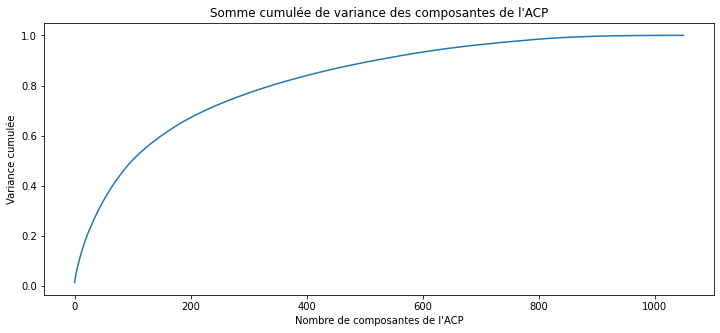

In [79]:
plt.figure(figsize=(12,5))
plt.title('Somme cumulée de variance des composantes de l\'ACP')
plt.xlabel('Nombre de composantes de l\'ACP')
plt.ylabel('Variance cumulée')
plt.plot(list(range(X.shape[0])),
         np.cumsum(pca.explained_variance_ratio_))


In [80]:
sum_pca = np.cumsum(pca.explained_variance_ratio_)
for counter, value in enumerate(sum_pca):
    if value > 0.80:
        X_reduce = pca.transform(X)[:,:counter]
        break
    

In [81]:
print('nombre de features : {}, variance : {}'.format(counter+1,np.cumsum(pca.explained_variance_ratio_)[counter]))

nombre de features : 341, variance : 0.8006850006377424


In [82]:
X_reduce.shape

(1050, 340)

In [83]:
X_reduce.shape

(1050, 340)

**Export**

In [84]:
np.save('data_saved_X_reduce_NLP.csv', X_reduce)

**Données finales**

In [85]:
from ipywidgets import IntProgress
from ipywidgets import Text
from IPython.display import display
import time
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

In [86]:


dict_kmeans_nlp = {}

inertia_nlp = {}

max_clusters_nlp=100


f = IntProgress(min=1, max=max_clusters_nlp) # instantiate the bar
chaine = str(1)+'/'+str(max_clusters_nlp)
g = Text(value=chaine)
display(f) # display the bar
display(g)

for k in range(1,max_clusters_nlp):
    kmeans_nlp = KMeans(n_clusters=k,
                   verbose=0,
                   random_state=0,
                   ).fit(X_reduce)
    inertia_nlp[k] = kmeans_nlp.inertia_
    dict_kmeans_nlp[k] = kmeans_nlp
    f.value = k # signal to increment the progress bar
    g.value =str(k)+'/'+str(max_clusters_nlp)

IntProgress(value=1, min=1)

Text(value='1/100')


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
   KMP_PLAIN_BARRIER_P

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:title={'center':'Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters'}>

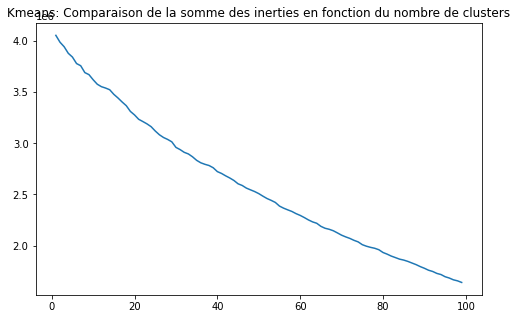

In [87]:
plt.figure(figsize=(8,5))
plt.title('Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters')
sns.lineplot(list(inertia_nlp.keys()),
             list(inertia_nlp.values())
            )

In [88]:
from sklearn.metrics import silhouette_score

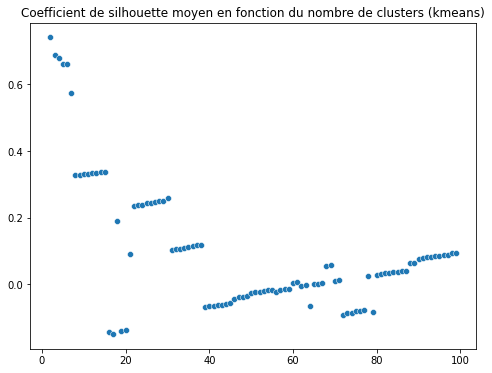

In [89]:

silhouettes_kmeans_nlp = {}
for i in range(2,max_clusters_nlp):
    silhouettes_kmeans_nlp[i] = silhouette_score(X = X_reduce,
                                             labels= list(dict_kmeans_nlp[i].labels_))

plt.figure(figsize=(8,6)),
plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (kmeans)')
sns.scatterplot(x = list(silhouettes_kmeans_nlp.keys()),
               y = list(silhouettes_kmeans_nlp.values()))
plt.show()



In [90]:
for key, value in silhouettes_kmeans_nlp.items():
    if value == max(silhouettes_kmeans_nlp.values()):
        print('le coefficient de silhouette est maximal pour {} clusters (score = {})'.format(key, value))
        nb_clusters_optimal = key

le coefficient de silhouette est maximal pour 2 clusters (score = 0.7401464071936491)


In [91]:
if nb_clusters_optimal < 5:
    nb_clusters_optimal = 10

In [92]:
dict_kmeans_nlp[nb_clusters_optimal]

KMeans(n_clusters=10, random_state=0)

In [93]:
train_nlp = pd.concat([train, test]).copy()
train_nlp['label_kmeans'] = dict_kmeans_nlp[nb_clusters_optimal].labels_

Comparaison des clusters par rapport aux catégories présentes dans le jeu de données de base

In [94]:
groups_cat_kmeans_nlp = train_nlp[['cat_lvl_2', 'label_kmeans']].groupby('label_kmeans')
val_presence = []
for i in range(1,nb_clusters_optimal):
    val_presence.append(groups_cat_kmeans_nlp.get_group(i).groupby('cat_lvl_2').count().sort_values(by='label_kmeans', ascending=False).iloc[0].tolist()[0]/groups_cat_kmeans_nlp.get_group(i).groupby('cat_lvl_2').count().sum().values.tolist()[0]*100)

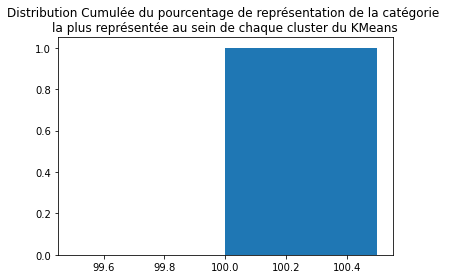

In [95]:
plt.title('Distribution Cumulée du pourcentage de représentation de la catégorie \nla plus représentée au sein de chaque cluster du KMeans')
plt.hist(val_presence,cumulative=True, density=True, bins=nb_clusters_optimal)
plt.show()

Pour la majorité des clusters (95%), la catégorie la plus représentée représente moins de 20 % des individus de l'échantillon. Notre classifieur n'a pas identifié les mêmes catégories que celles présentées dans le jeu de données initial.

# Données visuelles

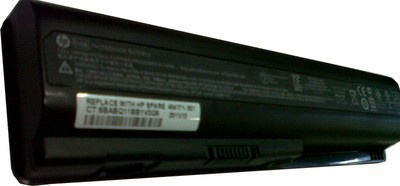

In [96]:
from IPython.display import Image
Image('/kaggle/input/dataset-flipkart/Flipkart/Images/'+ str(data.sample(1)['image'].values.tolist()[0]), width=100 )

Ensuite, vous analyserez le jeu de données déjà constitué en réalisant un prétraitement des images et des descriptions des produits, une réduction de dimension, puis un clustering. Les résultats du clustering seront présentés sous la forme d’une représentation en deux dimensions à déterminer, qui ’illustrera le fait que les caractéristiques extraites permettent de regrouper des produits de même catégorie.

La représentation graphique vous aidera à convaincre Linda que cette approche de modélisation permettra bien de regrouper des produits de même catégorie.

Attention, Linda n’a pas besoin d’un moteur de classification à ce stade, mais bien d’une étude de faisabilité !


In [97]:
#Echantillon de données
img_echantillon = data.sample(50, random_state=10)

In [98]:
img_echantillon 

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
775,93618b8a998782d4d847ee5cba5c7de2,2015-12-12 11:46:53 +0000,http://www.flipkart.com/carter-s-self-design-s...,Carter'S Self Design Single Blanket Multicolor,BLAE7ZARKHFBHYE8,1599.0,980.0,93618b8a998782d4d847ee5cba5c7de2.jpg,False,Buy Carter'S Self Design Single Blanket Multic...,No rating available,No rating available,Carter'S,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Baby Care,Baby Bedding,Baby Blankets
806,9c06a95a82c3bd6635b9fe6e92b15902,2015-12-12 11:46:53 +0000,http://www.flipkart.com/mxofere-combo-papaya-m...,Mxofere Combo Papaya Mixfruit Almond Honey Ora...,CBKEBVA8H7KPU6HK,285.0,285.0,9c06a95a82c3bd6635b9fe6e92b15902.jpg,False,Buy Mxofere Combo Papaya Mixfruit Almond Honey...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Organic Ty...",Beauty and Personal Care,Combos and Kits,Mxofere Combos and Kits
694,0ae859a69c7608d8197c3ba8c37bc6ec,2015-12-31 09:19:31 +0000,http://www.flipkart.com/tallenge-christmas-col...,Tallenge Christmas Collection - Echoes Of Wint...,PTGEDZBHZHGW2H4H,2499.0,1799.0,0ae859a69c7608d8197c3ba8c37bc6ec.jpg,False,Tallenge Christmas Collection - Echoes Of Wint...,No rating available,No rating available,Tallenge,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Decor & Festive Needs,Wall Decor & Clocks,Paintings
370,b42a9b597a3a3dc8f428e2e2323e9aff,2015-12-01 06:13:00 +0000,http://www.flipkart.com/anna-andre-paris-flora...,Anna Andre Paris Floralina & Red Horizon Combo...,CAGDTN27DEWJYUHK,355.0,249.0,b42a9b597a3a3dc8f428e2e2323e9aff.jpg,False,Flipkart.com: Buy Anna Andre Paris Floralina &...,4,4,NaN,"{""product_specification""=>[{""key""=>""Number of ...",Beauty and Personal Care,Fragrances,Deodorants
547,987e13b445c34bfedb9796d2bb78d593,2016-01-07 05:50:25 +0000,http://www.flipkart.com/maxima-01727lpln-mac-g...,Maxima 01727LPLN Mac Gold Analog Watch - For ...,WATDZ5HGF7WGCFGH,650.0,650.0,987e13b445c34bfedb9796d2bb78d593.jpg,True,Maxima 01727LPLN Mac Gold Analog Watch - For ...,5,5,NaN,"{""product_specification""=>[{""key""=>""Mechanism""...",Watches,Wrist Watches,Maxima Wrist Watches
244,0c4718ae90f2889b7021a99ee1cc106c,2015-12-01 12:40:44 +0000,http://www.flipkart.com/bergner-kadhai-na-l/p/...,Bergner Kadhai NA L,PTPECA2QYCZH8MBV,1499.0,1499.0,0c4718ae90f2889b7021a99ee1cc106c.jpg,False,"Bergner Kadhai NA L (Aluminium, Non-stick)\r\n...",No rating available,No rating available,Bergner,"{""product_specification""=>[{""key""=>""Pan Type"",...",Kitchen & Dining,Cookware,Pots & Pans
369,53c4f1e5cb1767f1a6ba05d32dfaf107,2015-12-01 06:13:00 +0000,http://www.flipkart.com/tenda-3g300m/p/itmdngv...,Tenda 3G300M,RTRDNGVMRQ63YU54,3000.0,1718.0,53c4f1e5cb1767f1a6ba05d32dfaf107.jpg,False,Buy Tenda 3G300M only for Rs. 3000 from Flipka...,4,4,Tenda,"{""product_specification""=>[{""key""=>""Wireless S...",Computers,Network Components,Routers
757,44a6d9f64668b004c3254f3904142064,2015-12-12 11:46:53 +0000,http://www.flipkart.com/svm-navratri-special-7...,SVM Navratri Special 7 Analog Watch - For Gir...,WATEB3ZEPX4XYBHG,2499.0,244.0,44a6d9f64668b004c3254f3904142064.jpg,False,SVM Navratri Special 7 Analog Watch - For Gir...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp...",Watches,Wrist Watches,SVM Wrist Watches
419,e365b55f806e5d0abe0094a9f2590e33,2015-12-01 06:13:00 +0000,http://www.flipkart.com/tenda-3g622r/p/itmdp2c...,Tenda 3G622R+,RTRDNGVMCGNCTWUU,3500.0,1913.0,e365b55f806e5d0abe0094a9f2590e33.jpg,False,Buy Tenda 3G622R+ only for Rs. 3500 from Flipk...,3.7,3.7,Tenda,"{""product_specification""=>[{""key""=>""In The Box...",Computers,Network Components,Routers
1041,b1644f47c7dfa58f8c06677f2a27ee09,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-extra-large...,Wallmantra 

In [99]:
img_echantillon['image'] = img_echantillon['image'].apply(lambda x: '/kaggle/input/dataset-flipkart/Flipkart/Images/'+str(x))

In [100]:
img_echantillon['image'].head(1)

775    /kaggle/input/dataset-flipkart/Flipkart/Images...
Name: image, dtype: object

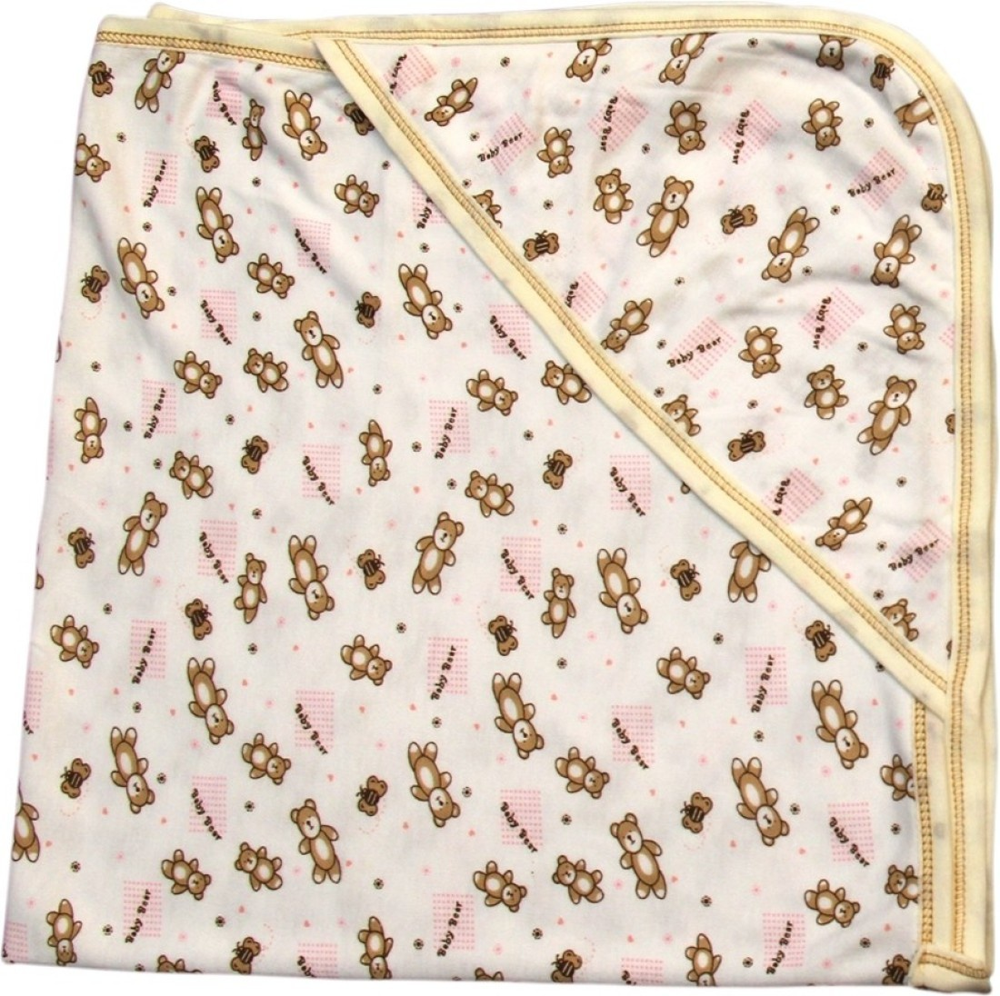

In [101]:
Image(img_echantillon.iloc[12]['image'], width=150)

In [102]:
img_echantillon.iloc[12]

uniq_id                                     8818424349b75a67775353d1feef2635
crawl_timestamp                                    2015-12-12 11:46:53 +0000
product_url                http://www.flipkart.com/offspring-printed-sing...
product_name                     Offspring Printed Single Wrapper Multicolor
pid                                                         BLAE8BUKXGJ3DHMG
retail_price                                                           375.0
discounted_price                                                       290.0
image                      /kaggle/input/dataset-flipkart/Flipkart/Images...
is_FK_Advantage_product                                                False
description                Buy Offspring Printed Single Wrapper Multicolo...
product_rating                                           No rating available
overall_rating                                           No rating available
brand                                                              Offspring

## Préambule : essai de convolution

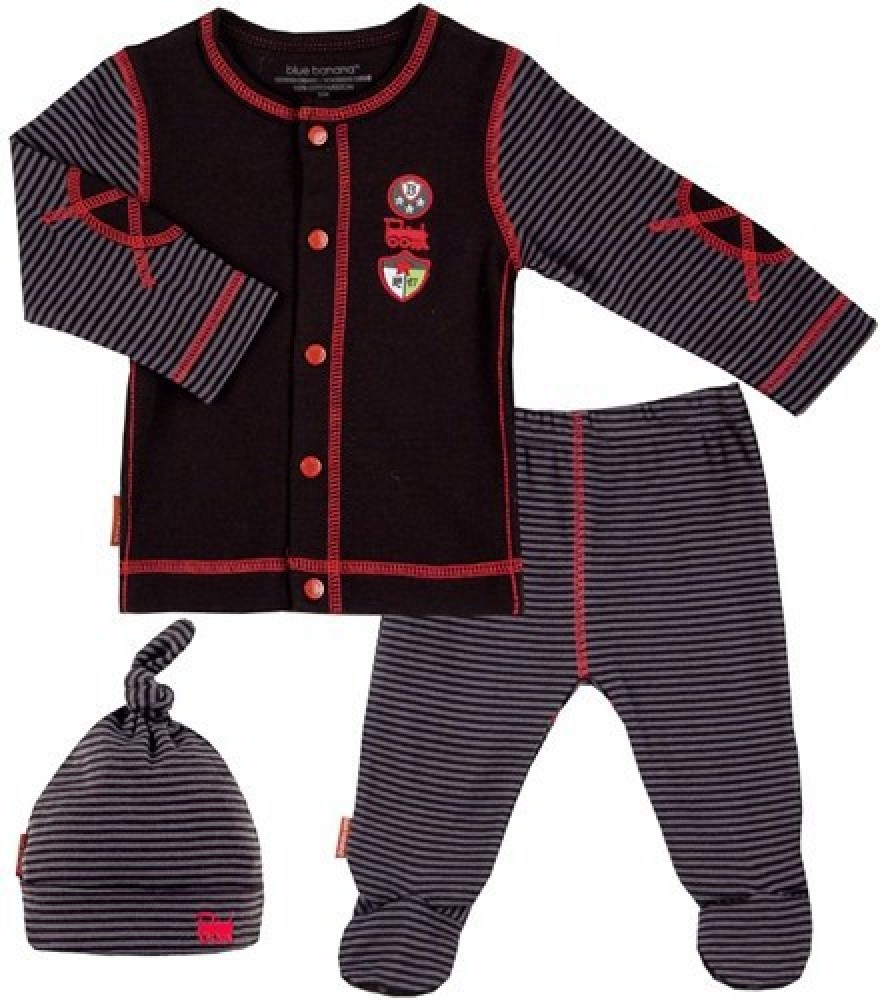

In [103]:
display(Image('/kaggle/input/dataset-flipkart/Flipkart/Images/9d3ca83f7017d6e9e129964e88503ff0.jpg', width=200))

In [104]:
img_conv = Image_PIL.open('/kaggle/input/dataset-flipkart/Flipkart/Images//93618b8a998782d4d847ee5cba5c7de2.jpg')

In [105]:
img_conv = np.array(img_conv)

In [106]:
img_conv = cv2.resize(img_conv, (200,200))

In [107]:
def filtre_moyenneur(img, voisinage = 1):
    '''Remplace chaque pixel par l\'intensité moyenne de son voisinage'''
    etendue = 1+2*voisinage
    img2 = np.copy(img)
    
    for i in range(0, img.shape[0]):
        for j in range(0, img.shape[1]):
            if (i<voisinage)|(i>img.shape[0] - voisinage-1):
                img2[i,j] = int(255/2)
            if (j<voisinage)|(j>img.shape[0] - voisinage-1):
                img2[i,j] = int(255/2)
            
            
    for i in range(voisinage,img.shape[0]-voisinage):
        for j in range(voisinage,img.shape[1]-voisinage):
            mean = 0
            for mean_x in range(i-voisinage, i+voisinage+1):
                for mean_y in range(j-voisinage, j+voisinage+1):
                    mean += img[mean_x, mean_y]
            img2[i,j] = mean/(etendue**2)
    
    
    return img2  

In [108]:
img_conv_traitee_1 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=1)
img_conv_traitee_2 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=2)
img_conv_traitee_3 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=3)
img_conv_traitee_4 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=4)


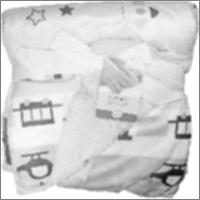

In [109]:
Image_PIL.fromarray(img_conv_traitee_1)

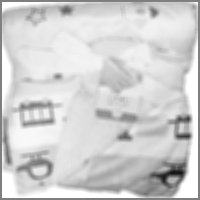

In [110]:
Image_PIL.fromarray(img_conv_traitee_2)

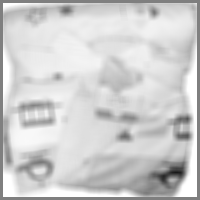

In [111]:
Image_PIL.fromarray(img_conv_traitee_3)

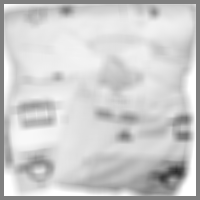

In [112]:
Image_PIL.fromarray(img_conv_traitee_4)

## Prétraitement

### Essais

**Réduction de bruit**

In [113]:
from scipy.ndimage import gaussian_filter
from PIL import Image as Image_PIL

In [114]:
im = np.array(Image_PIL.open(img_echantillon.iloc[12]['image']))

In [115]:
im = gaussian_filter(im, sigma=3)

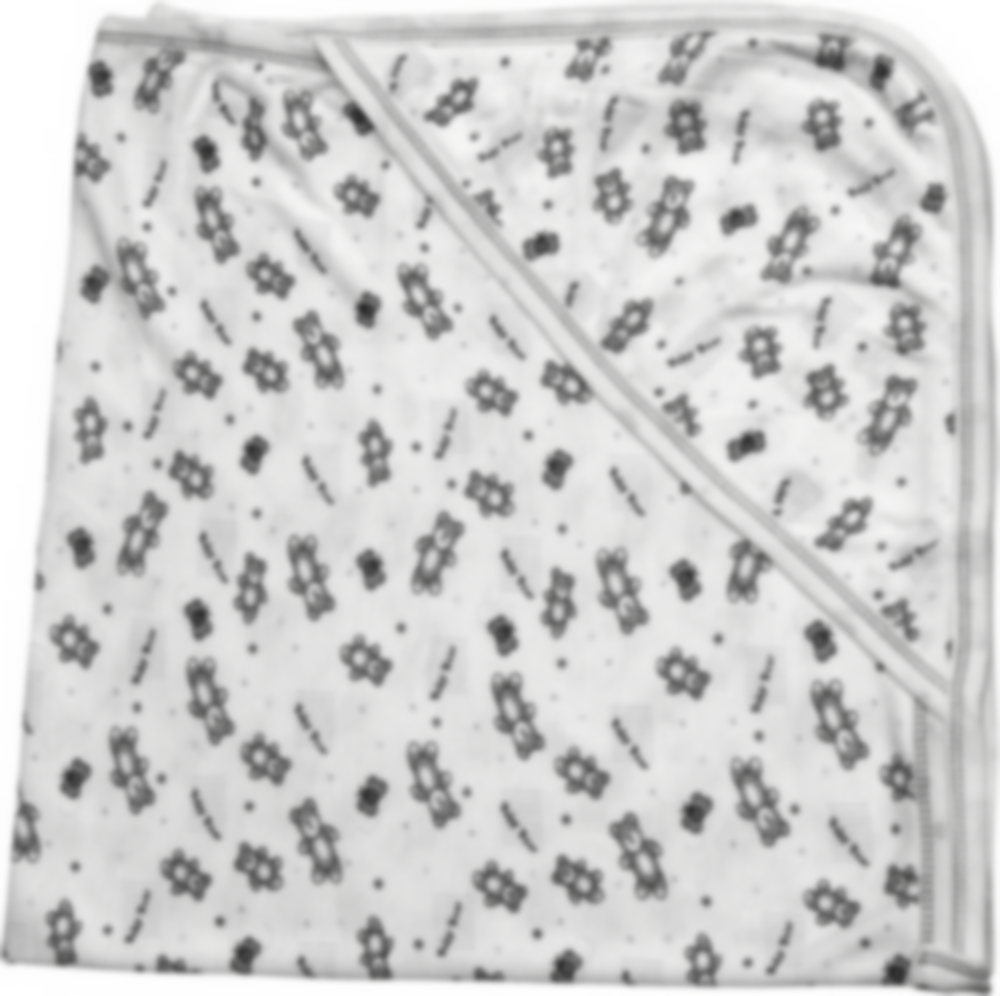

In [116]:
Image_PIL.fromarray(im)

**Egalisation**

In [117]:
hist, bins = np.histogram(im.flatten(), 256, [0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()

<Figure size 432x288 with 0 Axes>

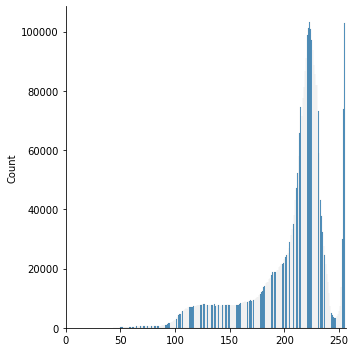

In [118]:
plt.figure(figsize=(6,4))
sns.displot(im.flatten())
plt.xlim([0,256])
plt.show()

In [119]:
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')

In [120]:
im2=cdf[im]

<Figure size 432x288 with 0 Axes>

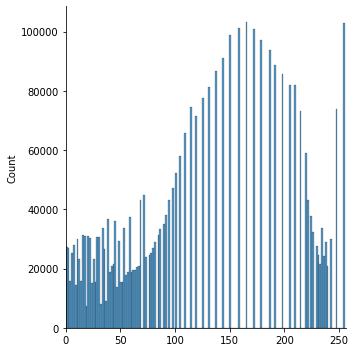

In [121]:
plt.figure(figsize=(6,4))
sns.displot(im2.flatten())
plt.xlim([0,256])
plt.show()

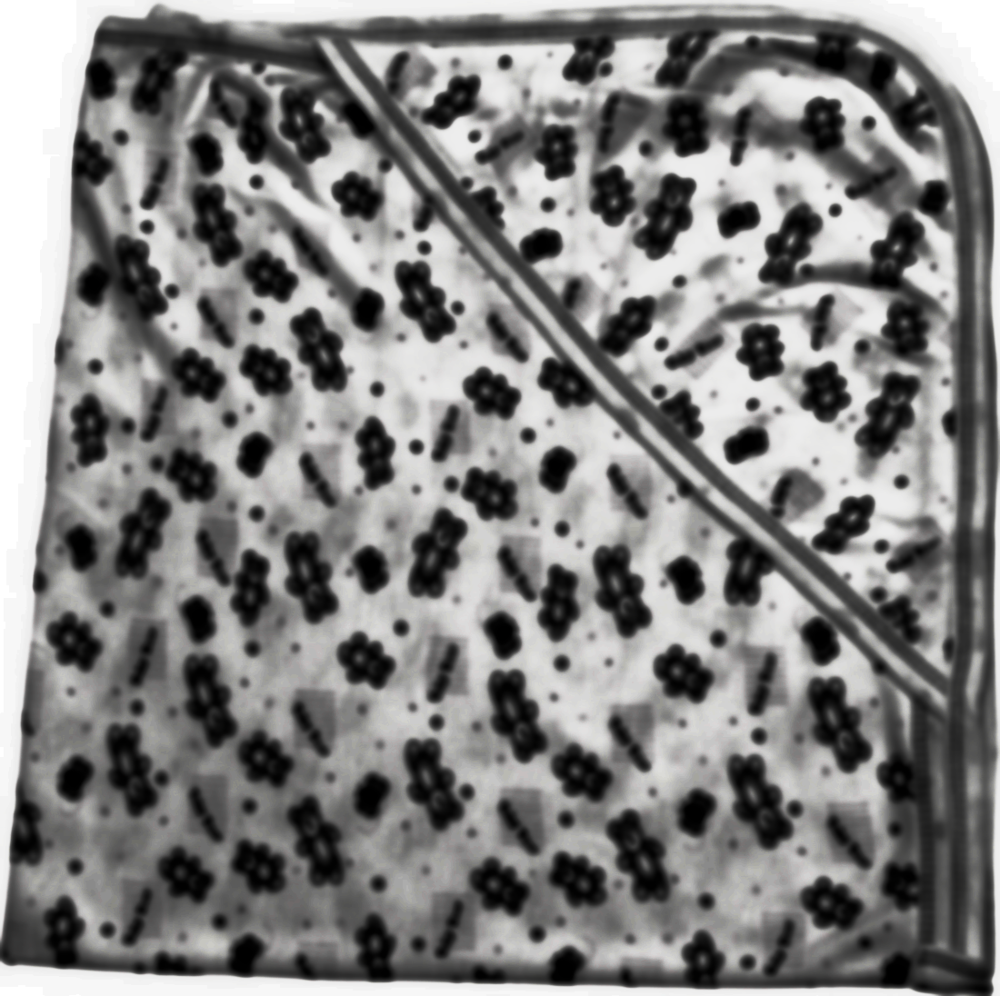

In [122]:
Image_PIL.fromarray(im2)

In [123]:
img3 = cv2.imread(img_echantillon.iloc[12]['image'],0)
equ = cv2.equalizeHist(img3)
res = np.hstack((img3,equ)) #stacking images side-by-side
cv2.imwrite('res.png',res)

True

In [124]:
img3.shape

(1096, 1100)

**Redimensionnement**

Taille d'origine des images

In [125]:
min_x = 100000
max_x = 0
min_y = 100000
max_y = 0
for image in img_echantillon['image'].tolist():
    shape = np.array(Image_PIL.open(image)).shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]

In [126]:
print('min_x {},\nmax_x {},\nmin_y {},\nmax_y {}'.format(min_x, max_x, min_y, max_y))

min_x 286,
max_x 4098,
min_y 302,
max_y 2800


Redimensionnement

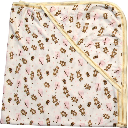

In [127]:
resize_img = cv2.resize(np.array(Image_PIL.open(img_echantillon.iloc[12]['image'])), dsize=(128,128))
Image_PIL.fromarray(resize_img)

### Fonction de prétraitement Complète

In [128]:
def redim(array_im, width, height):
    '''Redimensionne l\'image correspondant à array_im dans la largeur et la hauteur définie'''
    min_x = 100000
    max_x = 0
    min_y = 100000
    max_y = 0
    shape = array_im.shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]
    im = cv2.resize(array_im, dsize=(width,height))
    del shape
    return im

In [129]:
def preprocess(image, path=False):
    '''prétraitement des images:
    * filtre gaussian
    * égalisation de l'histogramme
    * redimensionnement
    prend un entrée le chemin vers l'image et en sortie la matrice np.array de l'image traitée
    '''
    #ouverture du fichier
    if path == False: #si on a fourni un array en entree :
        im = image
    else: #si on a fourni un chemin vers le fichier en entree:
        im = np.array(Image_PIL.open(image))
    
    #greyscale
    im = cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)
    
    #flou gaussien
    im = gaussian_filter(im, sigma=2)
    
    #égalisation
    im = cv2.equalizeHist(im)
    
    return redim(im, 128, 128)

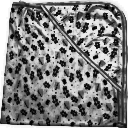

In [130]:
Image_PIL.fromarray(preprocess(img_echantillon.iloc[12]['image'], path=True))

## Extraction des caractéristiques (SIFT/ORB/SURF)

### Essais

**SIFT**

In [131]:
i = np.random.randint(img_echantillon.shape[0]-1)
img_sift = preprocess(img_echantillon.iloc[12]['image'], path=True)

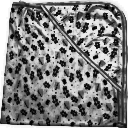

In [132]:
Image_PIL.fromarray(img_sift)

In [133]:
!pip install imutils

  Preparing metadata (setup.py) ... - done
  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25860 sha256=2c852ba8bb477948d8136404f9d36f096809e24b2b7d8f93d59fda33452dcac8
  Stored in directory: /root/.cache/pip/wheels/86/d7/0a/4923351ed1cec5d5e24c1eaf8905567b02a0343b24aa873df2
Successfully built imutils


In [134]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio
import imutils
cv2.ocl.setUseOpenCL(False)

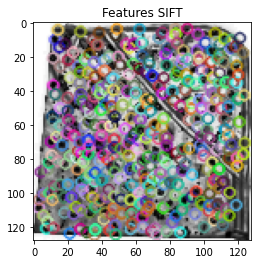

In [135]:
sift = cv2.SIFT_create()
kp = sift.detect(img_sift,None)
img=cv2.drawKeypoints(img_sift,kp,img_sift)

plt.figure(figsize=(4,4))
plt.title('Features SIFT')
plt.imshow(img)

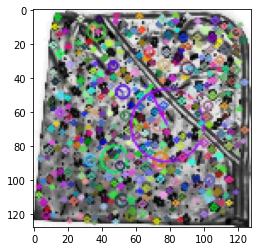

In [136]:
img=cv2.drawKeypoints(img_sift,kp,img_sift,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(4,4))
plt.imshow(img)

**ORB**

In [137]:
img_orb = preprocess(img_echantillon.iloc[i]['image'], path=True)

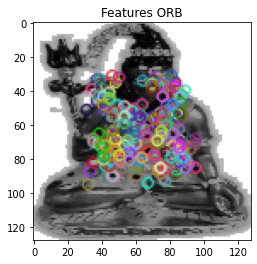

In [138]:
orb = cv2.ORB_create()

#find keypoints and descriptors
kp, des = orb.detectAndCompute(img_orb, mask = None)
#draw only keypoints location, not size and orientation:
image_orb = cv2.drawKeypoints(img_orb, kp, outImage = True, flags=2)
plt.title('Features ORB')
plt.imshow(image_orb)
plt.show()

In [139]:
len(kp)

243

In [140]:
des.shape

(243, 32)

### Fonctions

In [141]:
def get_files(path_list):
    '''Renvoie la liste des matrices d\'images à partir d'une liste de chemins'''
    liste_image = []
    compteur = 0
    for image_path in path_list:
        #im = cv2imread(image_path, 0)
        im = np.array(Image_PIL.open(image_path))
        liste_image.append(im)
        compteur +=1
    return liste_image

In [142]:
def create_features():
    '''Initialise un algorithme SIFT'''
    return cv2.SIFT_create()
    

def features(sift, image):
    '''renvoie les keypoints et descripteurs d\'une image à partir du détecteur sift'''
    keypoints,descriptors = sift.detectAndCompute(image,None)
    return [keypoints, descriptors]

def pipeline_feature(image):
    '''traitement complet d\'une image : 
    * initialise l\'algorithme, 
    *prétraite l'image, 
    *recherche les features
    *retourne les features'''
    
    sift = create_features()
    image = preprocess(image, path=False)
    #gr = grey(image)
    keypoints, descriptors = features(sift, image)
    return keypoints, descriptors

In [143]:

j=0

echantillon = get_files(img_echantillon['image'].tolist())
max_count = len(echantillon)
f = IntProgress(min=0, max=max_count) # instantiate the bar
chaine = str(0)+'/'+str(max_count)
g = Text(value=chaine)
display(f) # display the bar
display(g)
liste_keypoints = []
liste_descripteurs = []


for array_image in echantillon:
    j+=1
    kea,des = pipeline_feature(array_image)
    liste_keypoints.append(kea)
    liste_descripteurs.append(des)
    f.value = j # signal to increment the progress bar
    g.value =str(j)+'/'+str(max_count)

IntProgress(value=0, max=50)

Text(value='0/50')

In [144]:
liste_descripteurs[0]

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  6., ...,  0.,  0.,  0.],
       ...,
       [28.,  4.,  7., ...,  0.,  0.,  0.],
       [29., 32., 35., ...,  0.,  0.,  0.],
       [56., 12.,  0., ...,  0.,  0.,  0.]], dtype=float32)

In [145]:
liste_descripteurs[0].reshape(1,-1)

array([[0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [146]:
print('Nombre de liste de keypoints : ', len(liste_keypoints))
print('Nombre de keypoints pour l\'élément 0 : ', len(liste_keypoints[0]))
print('Nombre de keypoints pour l\'élément 2 : ', len(liste_keypoints[2]))

Nombre de liste de keypoints :  50
Nombre de keypoints pour l'élément 0 :  204
Nombre de keypoints pour l'élément 2 :  58


In [147]:
print('Dimension descripteurs élément 0 : ', liste_descripteurs[0].shape)
print('Dimension descripteurs élément 1 : ', liste_descripteurs[1].shape)

Dimension descripteurs élément 0 :  (204, 128)
Dimension descripteurs élément 1 :  (110, 128)


In [148]:
for el, ech in zip(liste_descripteurs, echantillon):
    print(el.shape, ' - ', ech.shape)

(204, 128)  -  (2224, 2208, 3)
(110, 128)  -  (496, 1238, 3)
(58, 128)  -  (1100, 1000, 3)
(98, 128)  -  (1100, 612, 3)
(61, 128)  -  (1360, 472, 3)
(77, 128)  -  (1488, 2800, 3)
(31, 128)  -  (1211, 739, 3)
(228, 128)  -  (4098, 1514, 3)
(32, 128)  -  (773, 756, 3)
(214, 128)  -  (1200, 900, 3)
(419, 128)  -  (1950, 1938, 3)
(171, 128)  -  (1100, 409, 3)
(505, 128)  -  (1096, 1100, 3)
(100, 128)  -  (1000, 668, 3)
(178, 128)  -  (921, 1100, 3)
(205, 128)  -  (1100, 1074, 3)
(176, 128)  -  (2000, 1640, 3)
(89, 128)  -  (1223, 1067, 3)
(53, 128)  -  (993, 1100, 3)
(237, 128)  -  (3558, 2356, 3)
(35, 128)  -  (995, 417, 3)
(84, 128)  -  (1100, 1031, 3)
(151, 128)  -  (1000, 880, 3)
(66, 128)  -  (1440, 1068, 3)
(269, 128)  -  (890, 592, 3)
(102, 128)  -  (995, 850, 3)
(230, 128)  -  (1312, 852, 3)
(57, 128)  -  (286, 416, 3)
(153, 128)  -  (1100, 815, 3)
(78, 128)  -  (1100, 1000, 3)
(93, 128)  -  (1100, 1068, 3)
(79, 128)  -  (1000, 302, 3)
(159, 128)  -  (2012, 1296, 3)
(116, 128)  -  

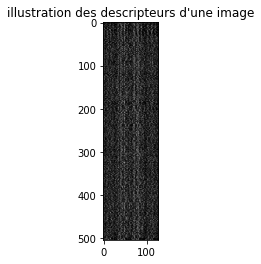

In [149]:
plt.title('illustration des descripteurs d\'une image')
plt.imshow(liste_descripteurs[12], cmap='gray')

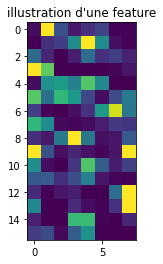

In [150]:
plt.figure(figsize=(4,4))
plt.title('illustration d\'une feature')
plt.imshow(liste_descripteurs[0][12].reshape(16,8))

In [151]:
def extraction_features(data_visu):
    '''Extraction des features à partir des données'''
    
    #chargement des images
    data_visu['image'] = data_visu['image'].apply(lambda x: "/kaggle/input/dataset-flipkart/Flipkart/Images/"+str(x))
    liste_images = get_files(data_visu['image'].tolist())
    max_count = len(liste_images)
    
    #affichage du compteur
    f = IntProgress(min=0, max=max_count) # instantiate the bar
    chaine = str(0)+'/'+str(max_count)
    g = Text(value=chaine)
    display(f) # display the bar
    display(g)
    liste_features = []
    liste_descripteurs = []
    liste_descripteurs_formates = []

    #boucle d'extraction des features de chaque image
    j=0
    for array_image in liste_images:
        j+=1
        fea, des = pipeline_feature(array_image)
        
        
        liste_features.append(fea)
        liste_descripteurs.append(des)
        f.value = j # signal to increment the progress bar
        g.value = str(j)+'/'+str(max_count)
    
    #harmonisation du nombre de features par image : détermination dimension maximum
    nb_features_max = 0
    for descripteur in liste_descripteurs:
        if descripteur.shape[0] > nb_features_max:
            nb_features_max = descripteur.shape[0]
    #on transforme les array des descripteurs en vecteurs (PM : un descripteur = 128 pixels de large)
    liste_descripteurs_flatten = []
    for descripteur in liste_descripteurs:
        liste_descripteurs_flatten.append(descripteur.reshape(1,-1))   
    
    #harmonisation du nombre de features par image : ajout pixels noirs
    k = 0
    for descripteur in liste_descripteurs_flatten:
        if descripteur.shape[1] <= nb_features_max*128:
            liste_descripteurs_formates.append(
                np.hstack([descripteur.reshape(1,-1), 
                           np.zeros(nb_features_max*128 - descripteur.shape[1]).reshape(1,-1)])
            )        
        else:
            liste_descripteurs_formates.append(descripteur)
            
    #assemblage_features
    array_descripteurs = np.vstack(liste_descripteurs_formates)
    
    del liste_descripteurs_formates, descripteur, liste_images, max_count
    
    
    return liste_features, liste_descripteurs, array_descripteurs

In [152]:
data_visuelle = pd.concat([train, test]).copy()
#data_visuelle = data.sample(100, random_state=42)

features_total, descripteurs_total, descripteurs_array = extraction_features(data_visuelle)

/opt/conda/lib/python3.7/site-packages/PIL/Image.py:2858: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


IntProgress(value=0, max=1050)

Text(value='0/1050')

In [153]:
descripteurs_array.shape

(1050, 64640)

In [154]:
descripteurs_array[0,:]

array([0., 0., 0., ..., 0., 0., 0.])

(1050, 64640)


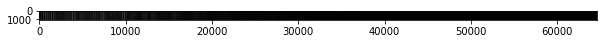

In [155]:
print(descripteurs_array.shape)
plt.figure(figsize=(10,10))
plt.imshow(descripteurs_array, cmap='gray')

export des descripteurs

### Création de nouvelles features à partir des descripteurs

In [156]:
descripteurs_total[0].shape

(65, 128)

In [157]:
np.var(descripteurs_total[0])

1585.5461

In [158]:
from scipy.stats import moment

liste_min = [np.min(descripteur) for descripteur in descripteurs_total]
liste_max = [np.max(descripteur) for descripteur in descripteurs_total]
liste_mean = [np.mean(descripteur) for descripteur in descripteurs_total]
liste_var = [np.var(descripteur) for descripteur in descripteurs_total]
liste_order_3 = [np.mean(moment(descripteur, moment = 3, axis=1)) for descripteur in descripteurs_total]
liste_order_4 = [np.mean(moment(descripteur, moment = 4, axis=1)) for descripteur in descripteurs_total]

In [159]:
array_features_descripteurs = np.vstack([liste_min, liste_max, liste_mean, liste_var, liste_order_3, liste_order_4])

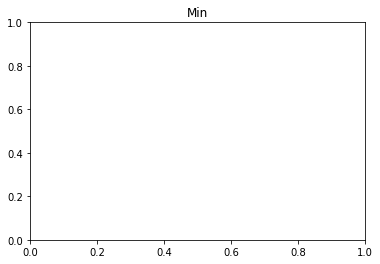

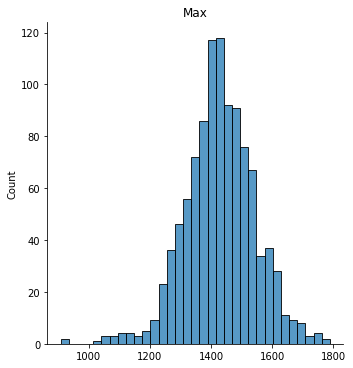

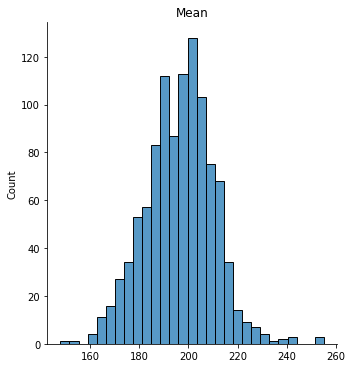

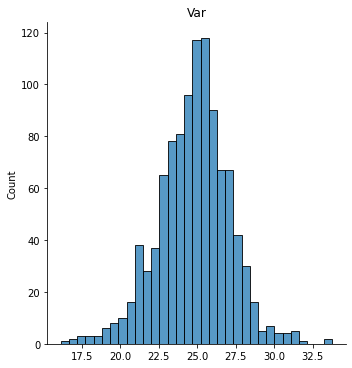

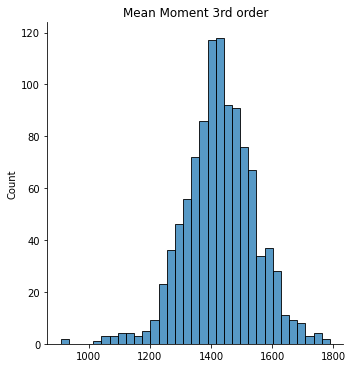

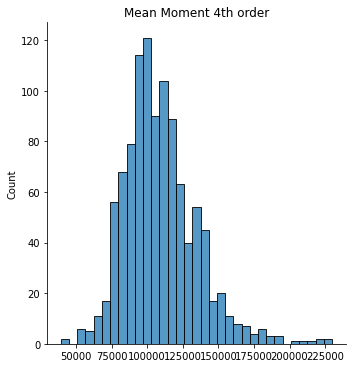

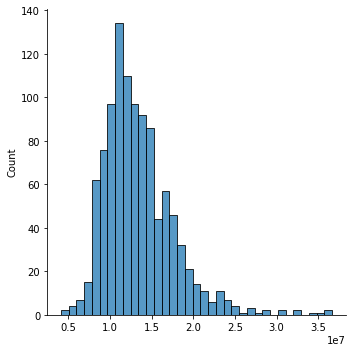

In [160]:
%matplotlib inline

plt.figure()
plt.title('Min')
sns.displot(liste_var)


plt.title('Max')
sns.displot(liste_max)


plt.title('Mean')
sns.displot(liste_mean)


plt.title('Var')
sns.displot(liste_var)


plt.title('Mean Moment 3rd order')
sns.displot(liste_order_3)

plt.title('Mean Moment 4th order')
sns.displot(liste_order_4)

### Export

In [161]:
np.save('data_saved_array_descripteurs.csv', descripteurs_array)
np.save('data_saved_array_features_descripteurs', array_features_descripteurs)

## Classifieur non supervisé

### ACP

In [162]:
pca_descripteurs = PCA()
features_ss = StandardScaler()
pca_descripteurs.fit(features_ss.fit_transform(np.transpose(descripteurs_array.T)))

PCA()

In [163]:
pca_descripteurs.n_components_

1050

In [164]:
np.cumsum(pca_descripteurs.explained_variance_ratio_)

array([0.19382076, 0.27627108, 0.33561039, ..., 1.        , 1.        ,
       1.        ])

In [165]:
list(range(descripteurs_array.shape[0]))

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


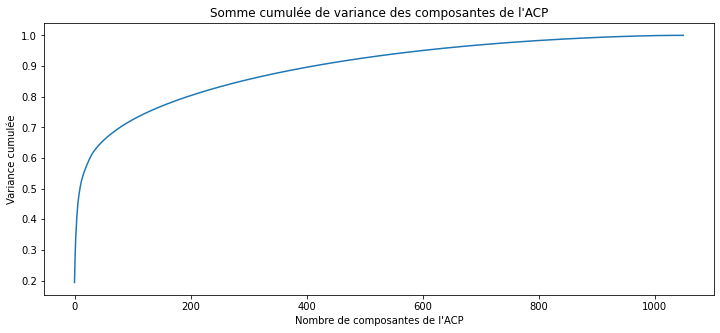

In [166]:
plt.figure(figsize=(12,5))
plt.title('Somme cumulée de variance des composantes de l\'ACP')
plt.xlabel('Nombre de composantes de l\'ACP')
plt.ylabel('Variance cumulée')
plt.plot(list(range(descripteurs_array.shape[0])),
         np.cumsum(pca_descripteurs.explained_variance_ratio_))

In [167]:
np.cumsum(pca_descripteurs.explained_variance_ratio_)[:650]

array([0.19382076, 0.27627108, 0.33561039, 0.37544917, 0.40772233,
       0.43396092, 0.45527679, 0.47101081, 0.48424049, 0.49669661,
       0.50700275, 0.51647438, 0.52511509, 0.53250359, 0.5391055 ,
       0.54517565, 0.55115269, 0.55634206, 0.56139396, 0.56629409,
       0.57109683, 0.57576467, 0.58035502, 0.58479059, 0.58909524,
       0.59327578, 0.59732387, 0.60133593, 0.60505564, 0.60862129,
       0.61201017, 0.61524905, 0.61814348, 0.62081938, 0.62335979,
       0.62587536, 0.62834774, 0.63076809, 0.63315939, 0.63542995,
       0.63769628, 0.63984984, 0.6419605 , 0.6440078 , 0.64603604,
       0.64800692, 0.64994933, 0.65185895, 0.65373568, 0.6555733 ,
       0.65740226, 0.65919829, 0.66095594, 0.66267799, 0.66436021,
       0.66603549, 0.66767836, 0.66928501, 0.67087174, 0.67243674,
       0.67398561, 0.67551357, 0.67702535, 0.6785203 , 0.67999865,
       0.68145405, 0.68289785, 0.68433542, 0.68575317, 0.68716319,
       0.68856294, 0.68994418, 0.6913151 , 0.69267304, 0.69401

95 % de la variance totale avec 650 features

In [168]:
array_descripteurs_reduit = pca_descripteurs.transform(descripteurs_array[:650,:])

In [169]:
array_descripteurs_reduit.shape

(650, 1050)

In [170]:
np.save('data_saved_array_descripteurs_reduit.csv', array_descripteurs_reduit)

### Classification

In [171]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

#### Kmeans

In [172]:
dict_kmeans = {}
inertia = {}
max_clusters=80

f = IntProgress(min=0, max=max_clusters) # instantiate the bar
chaine = str(0)+'/'+str(max_count)
g = Text(value=chaine)
display(f) # display the bar
display(g)

for k in range(1,max_clusters+1):
    kmeans = KMeans(n_clusters=k,
                   verbose=0,
                   random_state=0,
                   ).fit(array_descripteurs_reduit)
    inertia[k] = kmeans.inertia_
    dict_kmeans[k] = kmeans
    f.value = k # signal to increment the progress bar
    g.value =str(k+1)+'/'+str(max_clusters)

IntProgress(value=0, max=80)

Text(value='0/50')

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:title={'center':'Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters'}>

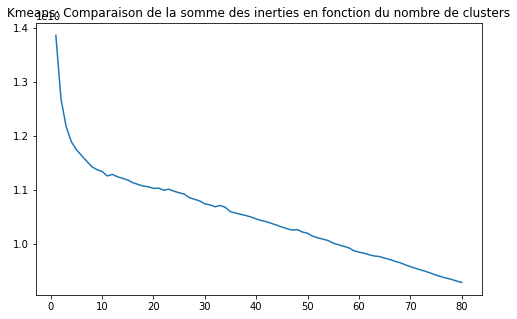

In [173]:
plt.figure(figsize=(8,5))
plt.title('Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters')
sns.lineplot(list(inertia.keys()),
             list(inertia.values())
            )

In [174]:
from sklearn.metrics import silhouette_score

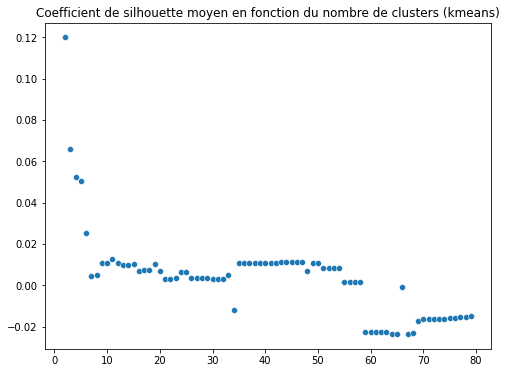

In [175]:

silhouettes_kmeans = {}
for i in range(2,max_clusters):
    silhouettes_kmeans[i] = silhouette_score(X = array_descripteurs_reduit,
                                             labels= list(dict_kmeans[i].labels_))

plt.figure(figsize=(8,6)),
plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (kmeans)')
sns.scatterplot(x = list(silhouettes_kmeans.keys()),
               y = list(silhouettes_kmeans.values()))
plt.show()



In [176]:
for key, value in silhouettes_kmeans.items():
    if value == max(silhouettes_kmeans.values()):
        print('le coefficient de silhouette est maximal pour {} clusters (score = {})'.format(key, value))
        nb_clusters = key

le coefficient de silhouette est maximal pour 2 clusters (score = 0.11988266139268754)


#### Visualisation des visual words

Exemple en prenant une séparation avec clusters

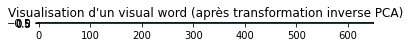

In [177]:
plt.title('Visualisation d\'un visual word (après transformation inverse PCA)')

plt.imshow(np.dot(dict_kmeans[25].cluster_centers_[4], pca_descripteurs.components_[:, :650]).reshape(1,-1))

#### Histogrammes

## CNN Données visuelles

### Report fonctions

In [178]:
def get_files(path_list):
    '''Renvoie la liste des matrices d\'images à partir d'une liste de chemins'''
    liste_image = []
    compteur = 0
    for image_path in path_list:
        #im = cv2.imread(image_path, 0)
        im = np.array(Image_PIL.open(image_path))
        liste_image.append(im)
        compteur +=1
    
    del compteur
    del im
    
    return liste_image

In [179]:
def redim(array_im, width, height):
    '''Redimensionne l\'image correspondant à array_im dans la largeur et la hauteur définie'''
    min_x = 100000
    max_x = 0
    min_y = 100000
    max_y = 0
    shape = array_im.shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]
    im = cv2.resize(array_im, dsize=(width,height))
    
    del shape
    
    return im

### Données

In [180]:
train['image'] = train['image'].apply(lambda x: "/kaggle/input/dataset-flipkart/Flipkart/Images/"+str(x))
test['image'] = test['image'].apply(lambda x: "/kaggle/input/dataset-flipkart/Flipkart/Images/"+str(x))

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [181]:
train_cnn = get_files(train.copy()['image'].tolist())
test_cnn = get_files(test.copy()['image'].tolist())

/opt/conda/lib/python3.7/site-packages/PIL/Image.py:2858: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


In [182]:
len(train_cnn)

787

In [183]:
len(test_cnn)

263

In [184]:
redim(train_cnn[0], 128, 128).shape

(128, 128, 3)

In [185]:
redim(train_cnn[0], 128, 128).reshape(1,-1,3).shape

(1, 16384, 3)

In [186]:
train_array_cnn = np.vstack([redim(img, 128, 128).reshape(1,128,128,3) for img in train_cnn])
test_array_cnn = np.vstack([redim(img, 128, 128).reshape(1,128,128,3) for img in test_cnn])

In [187]:
train_array_cnn.shape

(787, 128, 128, 3)

In [188]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(handle_unknown='ignore')
array_cats = ohe.fit_transform(np.array(train['cat_lvl_2']).reshape(-1,1))

In [189]:
array_cats.todense().shape

(787, 57)

In [190]:
array_cats.shape

(787, 57)

In [191]:
train_array_cats = ohe.transform(train[['cat_lvl_2']]).todense()
test_array_cats = ohe.transform(test[['cat_lvl_2']]).todense()

In [192]:
ohe.categories_

[array(['Baby & Kids Gifts', 'Baby Bath & Skin', 'Baby Bedding',
        'Baby Grooming', 'Bar & Glassware', 'Bath Linen', 'Bath and Spa',
        'Bed Linen', 'Body and Skin Care', 'Candles & Fragrances',
        'Clocks', 'Coffee Mugs', 'Combos and Kits', 'Computer Components',
        'Computer Peripherals', 'Containers & Bottles', 'Cookware',
        'Curtains & Accessories', 'Cushions, Pillows & Covers',
        'Decorative Lighting & Lamps', 'Diapering & Potty Training',
        'Dinnerware & Crockery', 'Eye Care', 'Feeding & Nursing',
        'Floor Coverings', 'Flowers, Plants & Vases', 'Fragrances',
        'Furniture & Furnishings', 'Garden & Leisure', 'Hair Care',
        'Health Care', 'Housekeeping & Laundry', 'Infant Wear',
        'Kitchen & Dining Linen', 'Kitchen Tools',
        "Kripa's Home Furnishing", 'Laptop Accessories', 'Laptops',
        'Lighting', 'Living', 'Living Room Furnishing', 'Makeup',
        'Network Components', 'Pressure Cookers & Pans',
        'R

### Construction Réseau

In [193]:
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Flatten, Dense, Activation

In [194]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3,3), padding='same', activation='relu', input_shape=(128,128,3,)))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(32, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())
model.add(Dense(ohe.categories_[0].shape[0], activation='softmax'))
model.compile(loss='mean_squared_error', optimizer='sgd')

2021-12-24 01:02:11.376518: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


In [195]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 32768)             0         
_________________________________________________________________
dense (Dense)                (None, 57)                1867833   
Total params: 1,877,977
Trainable params: 1,877,977
Non-trainable params: 0
______________________________________________

### Entraînement

In [196]:
train_array_cnn.shape

(787, 128, 128, 3)

In [197]:
model_info = model.fit(train_array_cnn, train_array_cats, epochs=3, batch_size=40, verbose=2)

2021-12-24 01:02:14.997339: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/3
20/20 - 5s - loss: 0.0350
Epoch 2/3
20/20 - 5s - loss: 0.0350
Epoch 3/3
20/20 - 5s - loss: 0.0350


In [198]:
for couche in model.get_weights():
    print(couche.shape)

(3, 3, 3, 32)
(32,)
(3, 3, 32, 32)
(32,)
(32768, 57)
(57,)


In [199]:
predictions_test = model.predict(test_array_cnn)

In [200]:
from sklearn.metrics import accuracy_score
accuracy_score(np.argmax(predictions_test, axis=1).reshape(-1,1), 
               np.argmax(test_array_cats, axis=1).reshape(-1,1))

0.0

In [201]:
np.argmax(test_array_cats, axis=1).reshape(1,-1)

matrix([[42, 38, 36, 26, 56, 32, 46, 14,  7,  7, 56,  1, 11,  6, 51, 36,
         32, 36,  5, 17, 16, 36, 32, 36, 56, 12, 19,  0, 26, 11, 11, 42,
         36, 56, 50,  7, 56, 46, 46, 42, 18, 41, 38, 17, 41, 34, 16, 48,
          0,  7, 11, 46, 15, 39, 42, 32, 29, 34, 51, 39,  5,  0, 56, 16,
         56,  5,  0, 19,  7, 56, 32, 36, 42, 36, 56, 42,  7, 46, 36,  7,
         33,  5, 42, 34, 42, 56, 24, 19, 46, 50, 40,  7, 11, 46, 56, 36,
         32, 56, 46, 32,  0, 56, 54, 40, 36, 56,  6, 15,  7, 36, 34,  7,
          7, 32,  1, 23, 36, 56, 56, 36, 42, 36, 54,  5, 11, 19, 12, 46,
         23,  1, 16, 41,  0, 46,  3, 11, 50, 12, 11, 36, 11,  2, 46, 33,
         17, 56, 56, 26, 50,  0, 56, 26, 56, 54, 42,  5, 56,  8, 54, 56,
         56, 56,  1, 36, 46, 56, 56, 42, 56, 36, 56, 26, 17, 56, 32, 56,
         46, 46,  7, 46, 32, 11, 17, 54, 32, 26, 27, 56, 36, 18, 26, 56,
         15, 17, 11, 14, 26, 16, 42, 42, 26, 32, 33, 42, 26, 54, 56, 32,
         20, 46, 56, 50, 36, 36, 17, 12, 32,  7, 46

In [202]:
np.argmax(predictions_test, axis=1)

array([49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49,
       49, 49, 49, 49, 49

In [203]:
ohe.categories_[0][25]

'Flowers, Plants & Vases'

### Observations

<span style='color:red'>8 % d'accuracy mais la prédiction est la même pour toutes les images du jeu de données. 
La catégorie prédite est la catégorie la plus représentée dans notre jeu de données de base.
Le résultat n'est pas concluant</span>

### Classification non supervisée 

In [204]:
from keras.models import clone_model

On retire les 2 dernières couches du réseau de neurone pour accéder aux features

In [205]:
unsupervised_model= clone_model(model)
unsupervised_model.layers.pop()
unsupervised_model.layers.pop()
unsupervised_model.compile(loss='mean_squared_error', optimizer='sgd')


In [206]:
unsupervised_array = unsupervised_model.predict(train_array_cnn)

In [207]:
unsupervised_array.shape

(787, 57)

In [208]:
dict_kmeans = {}
inertia = {}
max_clusters=50

f = IntProgress(min=0, max=max_clusters) # instantiate the bar
chaine = str(0)+'/'+str(max_clusters)
g = Text(value=chaine)
display(f) # display the bar
display(g)

for k in range(1,max_clusters+1):
    kmeans = KMeans(n_clusters=k,
                   verbose=0,
                   random_state=0,
                   ).fit(unsupervised_array)
    inertia[k] = kmeans.inertia_
    dict_kmeans[k] = kmeans
    f.value = k # signal to increment the progress bar
    g.value =str(k+1)+'/'+str(max_clusters)

IntProgress(value=0, max=50)

Text(value='0/50')

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:title={'center':'Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters'}>

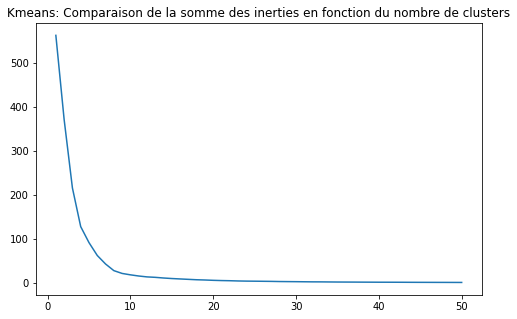

In [209]:
plt.figure(figsize=(8,5))
plt.title('Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters')
sns.lineplot(list(inertia.keys()),
             list(inertia.values())
            )

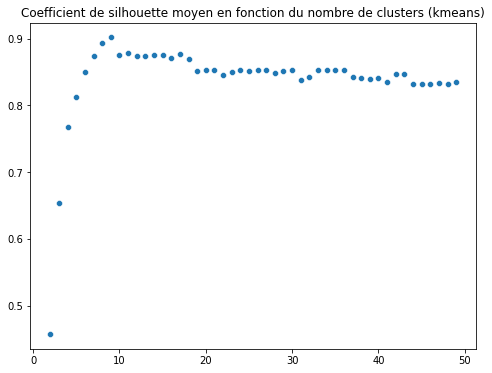

In [210]:
silhouettes_kmeans = {}
for i in range(2,max_clusters):
    silhouettes_kmeans[i] = silhouette_score(X = unsupervised_array,
                                             labels= list(dict_kmeans[i].labels_))

plt.figure(figsize=(8,6)),
plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (kmeans)')
sns.scatterplot(x = list(silhouettes_kmeans.keys()),
               y = list(silhouettes_kmeans.values()))
plt.show()



In [211]:
for key, value in silhouettes_kmeans.items():
    if value == max(silhouettes_kmeans.values()):
        print('le coefficient de silhouette est maximal pour {} clusters (score = {})'.format(key, value))
        nb_clusters_optimal = key

le coefficient de silhouette est maximal pour 9 clusters (score = 0.9018096923828125)


Nombre d'éléments par catégorie

In [212]:
pd.DataFrame(dict_kmeans[8].labels_)[0].value_counts()

0    236
1    230
2    162
4     48
5     41
3     26
6     24
7     20
Name: 0, dtype: int64

In [213]:
train_labelized = train.copy()
train_labelized['label_kmeans'] = dict_kmeans[nb_clusters_optimal].labels_

In [214]:
train_labelized.groupby(['label_kmeans']).apply(lambda x: (x.groupby('cat_lvl_2')
                                      .count()
                                      .sort_values('cat_lvl_2', ascending=False))
                                     )['uniq_id']

label_kmeans  cat_lvl_2                      
0             Wrist Watches                      45
              Wall Decor & Clocks                 3
              Tableware & Cutlery                 1
              Table Decor & Handicrafts          16
              TRUE Home Decor & Festive Needs     1
              Showpieces                         19
              Showpiece                           2
              Religion & Devotion                 2
              Network Components                 10
              Makeup                              4
              Living Room Furnishing              1
              Living                              2
              Lighting                            2
              Laptops                             2
              Laptop Accessories                 17
              Kitchen Tools                       3
              Kitchen & Dining Linen              1
              Infant Wear                        25
              Hous

In [215]:
pd.DataFrame(train, ).head(10)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
165,785b4383b12106dd172306d427d8f7b2,2015-12-01 12:40:44 +0000,http://www.flipkart.com/rockmantra-cute-two-ca...,Rockmantra Cute Two Cats Ceramic Mug,MUGEAGGKFBTYPN4Z,499.0,349.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,False,Rockmantra Cute Two Cats Ceramic Mug (5.5 l)\r...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va...",Kitchen & Dining,Coffee Mugs,Rockmantra Coffee Mugs
248,45d0af2c709de47268c80c35a117de44,2015-12-01 12:40:44 +0000,http://www.flipkart.com/malhar-niko-male-doll-...,Malhar Niko Male Doll Showpiece - 25 cm,SHIEY382SR75SXEY,6395.0,5436.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,True,Buy Malhar Niko Male Doll Showpiece - 25 cm ...,No rating available,No rating available,Malhar,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Decor & Festive Needs,Showpieces,Malhar Showpieces
310,64b463dc0b75ae40a848498c657041e6,2015-12-01 06:13:00 +0000,http://www.flipkart.com/linksys-smart-wi-fi-ro...,Linksys Smart Wi-Fi Router,RTRDZTF9DBT4CW8U,14999.0,13500.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,True,Buy Linksys Smart Wi-Fi Router only for Rs. 0....,No rating available,No rating available,Linksys,"{""product_specification""=>[{""key""=>""Encryption...",Computers,Network Components,Routers
685,6b5cdfe68595fbcab0e05dc625d3d66a,2015-12-31 09:19:31 +0000,http://www.flipkart.com/richfeel-sunshield-spf...,Richfeel Sunshield - SPF 30 PA++,SNRE4F2GBWVF6UKR,299.0,224.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,False,Flipkart.com: Buy Richfeel Sunshield - SPF 30 ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Quantity"",...",Beauty and Personal Care,Body and Skin Care,Face Care
843,e86daf9ebcdfc5c5dd088cdb7f8f8db6,2015-12-29 05:07:38 +0000,http://www.flipkart.com/epresent-mfan-1-fan-us...,Epresent Mfan 1 Fan USB USB Fan,USGEB3HTYWCYT2HY,269.0,219.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,False,Buy Epresent Mfan 1 Fan USB USB Fan for Rs.219...,No rating available,No rating available,Epresent,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Computers,Laptop Accessories,USB Gadgets
342,17a73d7c4b02ada2bfeed1115fed08a4,2015-12-01 06:13:00 +0000,http://www.flipkart.com/envy-1000-force-combo-...,Envy-1000 Force Combo Set,CAGE79CEHJZX52XS,360.0,329.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,False,Flipkart.com: Buy Envy-1000 Force Combo Set on...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Number of ...",Beauty and Personal Care,Fragrances,Deodorants
605,bcb8e456728013a90ba66ab3b1b783ad,2016-01-07 04:32:43 +0000,http://www.flipkart.com/hp-15-ac121tu-notebook...,HP 15-ac121tu (Notebook) (Core i3 (5th Gen)/ 4...,COMEAZ94HWYQTZHZ,35390.0,35390.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,True,Buy HP 15-ac121tu (Notebook) (Core i3 (5th Gen...,4.5,4.5,HP,"{""product_specification""=>[{""key""=>""Included S...",Computers,Laptops,HP Laptops
526,9059227d71995f88a1f48ff63830f716,2016-01-07 05:50:25 +0000,http://www.flipkart.com/fluid-fu203-gr01-analo...,Fluid FU203-GR01 Analog-Digital Watch - For Men,WATDUK7DV6GSTKRD,899.0,899.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,True,Fluid FU203-GR01 Analog-Digital Watch - For M...,3,3,NaN,"{""product_specification""=>[{""key""=>""Other Func...",Watches,Wrist Watches,Fluid Wrist Watches
65,2baa415ebcc4fe563ce13b50e60efc1c,2016-06-10 21:33:30 +0000,http://www.flipkart.com/shopmania-happy-birthd...,Shopmania Happy Birthday Gift For Starting Let...,MUGEJG6TBVQSYMUP,449.0,225.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,False,Key Features of Shopmania Happy Birthday Gift ...,No rating available,No rating available,Shopmania,"{""product_specification""=>[{""key""=>""

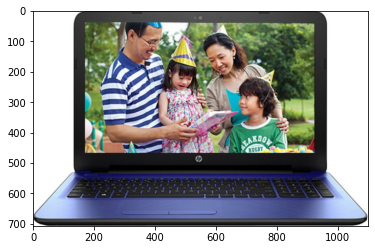

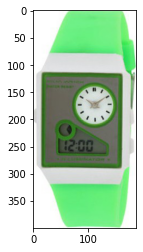

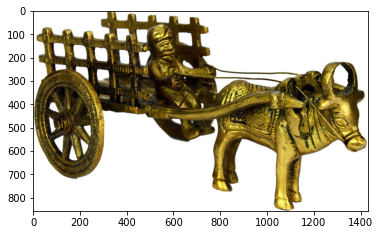

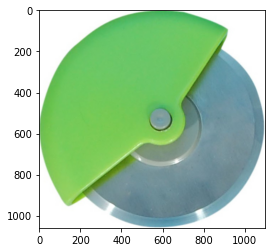

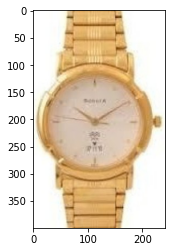

...

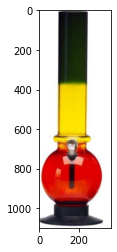

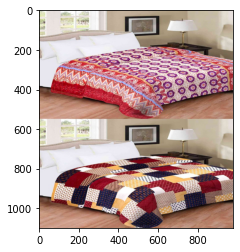

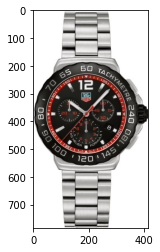

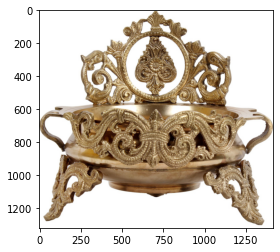

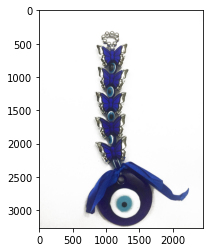

In [216]:
%matplotlib inline
k = 0
for image in train_labelized[train_labelized['label_kmeans'] == 0]['image'].tolist():
    if k < 20:
        chemin = image
        plt.figure()
        plt.imshow(Image_PIL.open(chemin))
        plt.show()
        k+=1
    else:
        break

# Annexe : Check mémoire

In [217]:
import sys

# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
pd.DataFrame(sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True))

,0,1
0,descripteurs_array,542976112
1,X,40563712
2,train_array_cnn,38682768
3,test_array_cnn,12927120
4,array_image,11552384
5,ech,11552384
6,array_descripteurs_reduit,5460112
7,im,3616928
8,im2,3616928
9,data_visuelle,2451852


In [218]:
%reset_selective train_array_cnn --y

In [219]:
%reset_selective -f [image_essai, im, im2, array_image, ech, data_visuelle]

# Imports

In [220]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2 #opencv pour SIFT


pd.options.display.max_rows = 999

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import NMF, LatentDirichletAllocation
from sklearn.preprocessing import StandardScaler

from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

from string import punctuation
from nltk.corpus import stopwords
from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer 
from nltk import word_tokenize
from keras.preprocessing.image import load_img, img_to_array
#from keras.applications.vgg16 import preprocess_input
#from keras.applications.vgg16 import VGG16

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Flatten, Dense, Activation
from keras.models import clone_model

from ipywidgets import IntProgress
from ipywidgets import Text
from IPython.display import display
from IPython.display import Image

from scipy.ndimage import gaussian_filter
from PIL import Image as Image_PIL

import time

# Check memory

In [221]:
import sys

# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
pd.DataFrame(sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True))

,0,1
0,X,40563712
1,LatentDirichletAllocation,2008
2,TfidfVectorizer,2008
3,kp,2000
4,CountVectorizer,1472
5,GridSearchCV,1472
6,Image,1472
7,KMeans,1472
8,LogisticRegression,1472
9,NMF,1472


# Préparation données

In [222]:
data = pd.read_csv('data_saved_data_categories.csv')

In [223]:
data.head()

,Unnamed: 0,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
0,0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains
1,1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels
2,2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels
3,3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets
4,4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Bed Linen,Bedsheets


In [224]:
train = pd.read_csv('data_saved_train.csv')
test = pd.read_csv('data_saved_test.csv')

In [225]:
train.head()

,Unnamed: 0,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
0,165,785b4383b12106dd172306d427d8f7b2,2015-12-01 12:40:44 +0000,http://www.flipkart.com/rockmantra-cute-two-ca...,Rockmantra Cute Two Cats Ceramic Mug,MUGEAGGKFBTYPN4Z,499.0,349.0,785b4383b12106dd172306d427d8f7b2.jpg,False,Rockmantra Cute Two Cats Ceramic Mug (5.5 l)\r...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va...",Kitchen & Dining,Coffee Mugs,Rockmantra Coffee Mugs
1,248,45d0af2c709de47268c80c35a117de44,2015-12-01 12:40:44 +0000,http://www.flipkart.com/malhar-niko-male-doll-...,Malhar Niko Male Doll Showpiece - 25 cm,SHIEY382SR75SXEY,6395.0,5436.0,45d0af2c709de47268c80c35a117de44.jpg,True,Buy Malhar Niko Male Doll Showpiece - 25 cm ...,No rating available,No rating available,Malhar,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Decor & Festive Needs,Showpieces,Malhar Showpieces
2,310,64b463dc0b75ae40a848498c657041e6,2015-12-01 06:13:00 +0000,http://www.flipkart.com/linksys-smart-wi-fi-ro...,Linksys Smart Wi-Fi Router,RTRDZTF9DBT4CW8U,14999.0,13500.0,64b463dc0b75ae40a848498c657041e6.jpg,True,Buy Linksys Smart Wi-Fi Router only for Rs. 0....,No rating available,No rating available,Linksys,"{""product_specification""=>[{""key""=>""Encryption...",Computers,Network Components,Routers
3,685,6b5cdfe68595fbcab0e05dc625d3d66a,2015-12-31 09:19:31 +0000,http://www.flipkart.com/richfeel-sunshield-spf...,Richfeel Sunshield - SPF 30 PA++,SNRE4F2GBWVF6UKR,299.0,224.0,6b5cdfe68595fbcab0e05dc625d3d66a.jpg,False,Flipkart.com: Buy Richfeel Sunshield - SPF 30 ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Quantity"",...",Beauty and Personal Care,Body and Skin Care,Face Care
4,843,e86daf9ebcdfc5c5dd088cdb7f8f8db6,2015-12-29 05:07:38 +0000,http://www.flipkart.com/epresent-mfan-1-fan-us...,Epresent Mfan 1 Fan USB USB Fan,USGEB3HTYWCYT2HY,269.0,219.0,e86daf9ebcdfc5c5dd088cdb7f8f8db6.jpg,False,Buy Epresent Mfan 1 Fan USB USB Fan for Rs.219...,No rating available,No rating available,Epresent,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Computers,Laptop Accessories,USB Gadgets


In [226]:
def get_files(path_list):
    '''Renvoie la liste des matrices d\'images à partir d'une liste de chemins'''
    liste_image = []
    compteur = 0
    for image_path in path_list:
        #im = cv2.imread(image_path, 0)
        im = np.array(Image_PIL.open(image_path))
        liste_image.append(im)
        compteur +=1
    
    del compteur
    del im
    
    return liste_image

In [227]:
def redim(array_im, width, height):
    '''Redimensionne l\'image correspondant à array_im dans la largeur et la hauteur définie'''
    min_x = 100000
    max_x = 0
    min_y = 100000
    max_y = 0
    shape = array_im.shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]
    im = cv2.resize(array_im, dsize=(width,height))
    
    del shape
    
    return im

In [228]:
    train['image'] = train['image'].apply(lambda x:"/kaggle/input/dataset-flipkart/Flipkart/Images/"+str(x))
    test['image'] = test['image'].apply(lambda x:"/kaggle/input/dataset-flipkart/Flipkart/Images/" +str(x))

In [229]:
train_cnn = get_files(train.copy()['image'].tolist())

In [230]:
test_cnn = get_files(test.copy()['image'].tolist())

    

/opt/conda/lib/python3.7/site-packages/PIL/Image.py:2858: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


In [231]:
train_array_cnn = np.vstack([redim(img, 224, 224).reshape(1,224,224,3) for img in train_cnn])
test_array_cnn = np.vstack([redim(img, 224, 224).reshape(1,224,224,3) for img in test_cnn])

In [232]:
np.save('data_saved_train_images_array', train_array_cnn)
np.save('data_saved_test_images_array', test_array_cnn)

In [233]:
if False:
    train['image'] = train['image'].apply(lambda x:"/kaggle/input/dataset-flipkart/Flipkart/Images/" +str(x))
    test['image'] = test['image'].apply(lambda x:"/kaggle/input/dataset-flipkart/Flipkart/Images/" +str(x))

    train_cnn = get_files(train.copy()['image'].tolist())
    test_cnn = get_files(test.copy()['image'].tolist())

    train_array_cnn = np.vstack([redim(img, 224, 224).reshape(1,224,224,3) for img in train_cnn])
    test_array_cnn = np.vstack([redim(img, 224, 224).reshape(1,224,224,3) for img in test_cnn])
    del train_cnn,test_cnn
    #sauvegarde train_array_ccn / test_array_cnn
    np.save('data_saved_train_images_array', train_array_cnn)
    np.save('data_saved_test_images_array', test_array_cnn)
else :
    train_array_cnn = np.load('data_saved_train_images_array.npy')
    test_array_cnn = np.load('data_saved_test_images_array.npy')

In [234]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(handle_unknown='ignore')
array_cats = ohe.fit_transform(np.array(train['cat_lvl_2']).reshape(-1,1))

In [235]:
array_cats.todense().shape

(787, 57)

In [236]:
train_array_cats = ohe.transform(train[['cat_lvl_2']]).todense()
test_array_cats = ohe.transform(test[['cat_lvl_2']]).todense()

In [237]:
train_array_cats.shape

(787, 57)

In [238]:
test_array_cats.shape

(263, 57)

In [239]:
ohe.categories_[0].shape[0]

57

# Transfer Learning VGG16 Imagenet

In [240]:
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import VGG16
vgg = VGG16()
vgg.layers.pop()
vgg.layers.pop()

vgg_transfer = Sequential()
vgg_transfer.add(vgg)
vgg_transfer.trainable = False
vgg_transfer.add(Dense(ohe.categories_[0].shape[0], activation='softmax'))
vgg_transfer.compile(loss='mean_squared_error', optimizer='sgd')


553476096/553467096 [==============================] - 8s 0us/step


In [241]:
train_array_cnn = np.vstack([redim(img, 224, 224).reshape(1,224,224,3) for img in train_cnn])
test_array_cnn = np.vstack([redim(img, 224, 224).reshape(1,224,224,3) for img in test_cnn])

print('train array shape : ', train_array_cnn.shape)
print('train array cats : ', train_array_cats.shape)


train array shape :  (787, 224, 224, 3)
train array cats :  (787, 57)


In [242]:
vgg_transfer.fit(train_array_cnn, train_array_cats, epochs=3, batch_size=20, verbose=1)

Epoch 1/3
40/40 [==============================] - 202s 5s/step - loss: 0.0172
Epoch 2/3
40/40 [==============================] - 201s 5s/step - loss: 0.0172
Epoch 3/3
40/40 [==============================] - 203s 5s/step - loss: 0.0172


In [243]:
vgg_transfer.save_weights('models/weighs_vgg_transfer.weights')

In [244]:
vgg_transfer.load_weights('models/weighs_vgg_transfer.weights')

In [245]:
train.iloc[36]

Unnamed: 0                                                                82
uniq_id                                     601817defaff9d0e30e1b72f96d3975f
crawl_timestamp                                    2016-03-10 07:45:58 +0000
product_url                http://www.flipkart.com/chinmay-kids-printed-c...
product_name                 CHINMAY KIDS Printed Cotton Padded Mosquito Net
pid                                                         MNTEGKSZD2ZWUBZK
retail_price                                                          1490.0
discounted_price                                                       540.0
image                      /kaggle/input/dataset-flipkart/Flipkart/Images...
is_FK_Advantage_product                                                False
description                Specifications of CHINMAY KIDS Printed Cotton ...
product_rating                                           No rating available
overall_rating                                           No rating available

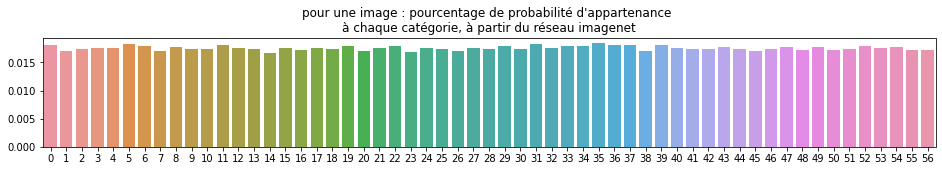

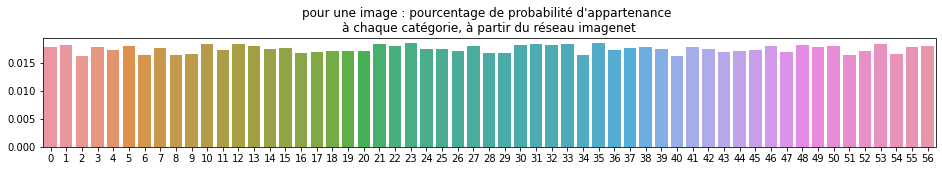

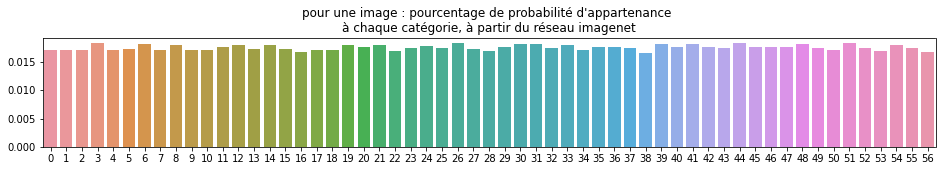

In [246]:
%matplotlib inline
ex_prediction_vgg = vgg_transfer.predict(redim(test_array_cnn[24], 224, 224).reshape(1,224,224,3))
plt.figure(figsize=(16,2))
plt.title('pour une image : pourcentage de probabilité d\'appartenance \nà chaque catégorie, à partir du réseau imagenet')
sns.barplot(x = list(range(ex_prediction_vgg.shape[1])), 
            y = ex_prediction_vgg[0])
plt.show()
ex_prediction_vgg = vgg_transfer.predict(redim(test_array_cnn[28], 224, 224).reshape(1,224,224,3))
plt.figure(figsize=(16,2))
plt.title('pour une image : pourcentage de probabilité d\'appartenance \nà chaque catégorie, à partir du réseau imagenet')
sns.barplot(x = list(range(ex_prediction_vgg.shape[1])), 
            y = ex_prediction_vgg[0])
plt.show()
ex_prediction_vgg = vgg_transfer.predict(redim(test_array_cnn[36], 224, 224).reshape(1,224,224,3))
plt.figure(figsize=(16,2))
plt.title('pour une image : pourcentage de probabilité d\'appartenance \nà chaque catégorie, à partir du réseau imagenet')
sns.barplot(x = list(range(ex_prediction_vgg.shape[1])), 
            y = ex_prediction_vgg[0])
plt.show()

In [247]:
vgg_train_output = vgg_transfer.predict(train_array_cnn)
vgg_test_output = vgg_transfer.predict(test_array_cnn)

In [248]:
vgg_train_output.shape

(787, 57)

In [249]:
vgg_test_output.shape

(263, 57)

In [250]:
vgg_output = np.vstack([vgg_train_output, vgg_test_output])

In [251]:
vgg_output.shape

(1050, 57)

In [252]:
np.save('data_saved_transfer_learning_output', vgg_output)

# Approche combinée

## Données

In [253]:
X_NLP = np.load('data_saved_X_reduce_NLP.csv.npy')
X_descripteurs = np.load('data_saved_array_features_descripteurs.npy')
X_CNN = np.load('data_saved_transfer_learning_output.npy')

In [254]:
X_NLP.shape

(1050, 340)

In [255]:
np.vstack([np.array(train['discounted_price']).reshape(-1,1),
           np.array(test['discounted_price']).reshape(-1,1)])

array([[  349.],
       [ 5436.],
       [13500.],
       ...,
       [  356.],
       [  550.],
       [  950.]])

In [256]:
np.array(data['discounted_price']).reshape(-1,1).shape[1]

1

## Homogénisation des dimensions

In [257]:
print('NLP : ', X_NLP.shape)
print('Descripteurs : ', X_descripteurs.T.shape)
print('CNN : ', X_CNN.shape)

NLP :  (1050, 340)
Descripteurs :  (1050, 6)
CNN :  (1050, 57)


on a 651 dimensions pour la partie textuelle et 63 pour la partie visuelle

## Assemblage des données

In [258]:
X_combined = np.hstack([np.array(data['discounted_price']).reshape(-1,1), 
           X_NLP,
           X_CNN, 
           X_descripteurs.T])

In [259]:
X_combined.shape

(1050, 404)

In [260]:
np.nan_to_num(X_combined, 0)

array([[ 8.99000000e+02, -9.31744543e-01, -4.00824672e-01, ...,
         1.58554614e+03,  1.53046328e+05,  2.10535040e+07],
       [ 4.49000000e+02, -2.00547167e+00, -7.85840265e-01, ...,
         1.41618787e+03,  1.02814805e+05,  1.22624530e+07],
       [ 0.00000000e+00, -2.01292240e+00, -7.44866972e-01, ...,
         1.66602747e+03,  1.70512578e+05,  2.33109740e+07],
       ...,
       [ 1.44900000e+03, -1.53336202e+00, -5.03274780e-01, ...,
         1.26231287e+03,  8.08644219e+04,  9.39830700e+06],
       [ 1.33300000e+03, -2.04916780e+00, -6.81325703e-01, ...,
         1.51630042e+03,  1.25671984e+05,  1.53128000e+07],
       [ 5.95000000e+02, -2.07995146e+00, -7.43598945e-01, ...,
         1.41296643e+03,  1.02172477e+05,  1.18697620e+07]])

In [261]:
np.save('data_saved_X_combined', X_combined)

In [262]:
X_combined = np.load('data_saved_X_combined.npy')

## Catégorisation

In [263]:
dict_kmeans = {}
inertia = {}
max_clusters=80

f = IntProgress(min=0, max=max_clusters) # instantiate the bar
g = Text(value='')
display(f) # display the bar
display(g)

for k in range(1,max_clusters+1):
    kmeans = KMeans(n_clusters=k,
                   verbose=0,
                   random_state=0,
                   ).fit(X_combined)
    inertia[k] = kmeans.inertia_
    dict_kmeans[k] = kmeans
    f.value = k # signal to increment the progress bar
    g.value =str(k)+'/'+str(max_clusters)

IntProgress(value=0, max=80)

Text(value='')

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:title={'center':'Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters'}>

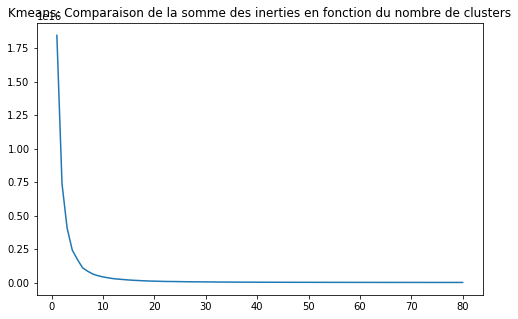

In [264]:
plt.figure(figsize=(8,5))
plt.title('Kmeans: Comparaison de la somme des inerties en fonction du nombre de clusters')
sns.lineplot(list(inertia.keys()),
             list(inertia.values())
            )

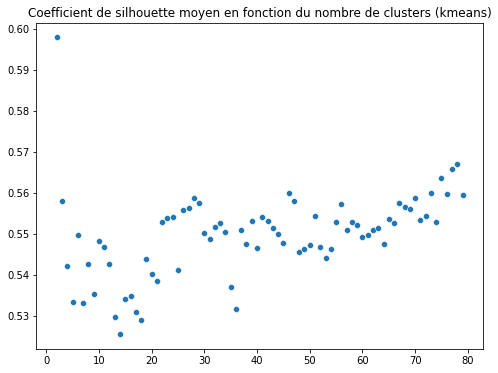

In [265]:

silhouettes_kmeans = {}
for i in range(2,max_clusters):
    silhouettes_kmeans[i] = silhouette_score(X = X_combined,
                                             labels= list(dict_kmeans[i].labels_))

plt.figure(figsize=(8,6)),
plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (kmeans)')
sns.scatterplot(x = list(silhouettes_kmeans.keys()),
               y = list(silhouettes_kmeans.values()))
plt.show()



In [266]:
for key, value in silhouettes_kmeans.items():
    if value == max(silhouettes_kmeans.values()):
        print('le coefficient de silhouette est maximal pour {} clusters (score = {})'.format(key, value))
        nb_clusters = key

le coefficient de silhouette est maximal pour 2 clusters (score = 0.5978282326115515)


/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


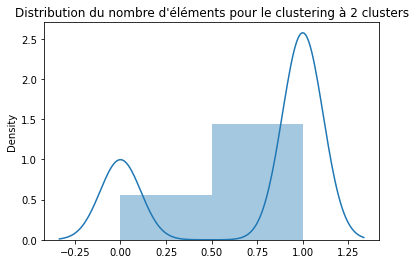

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


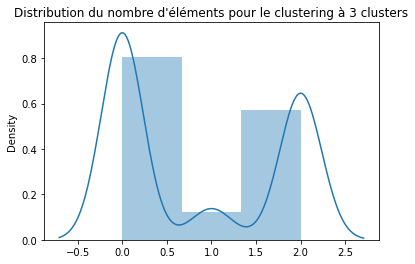

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


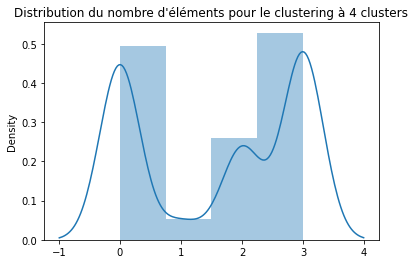

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


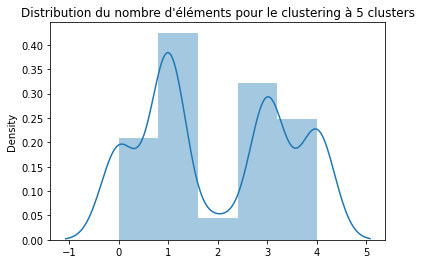

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


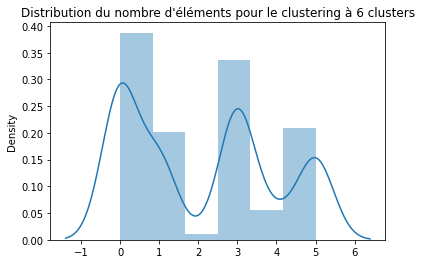

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


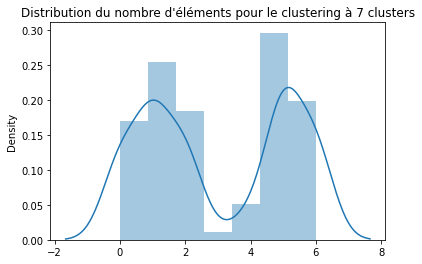

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


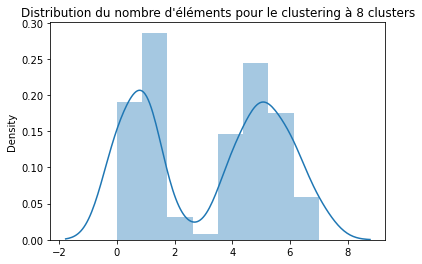

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


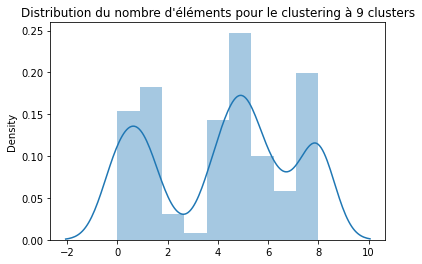

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


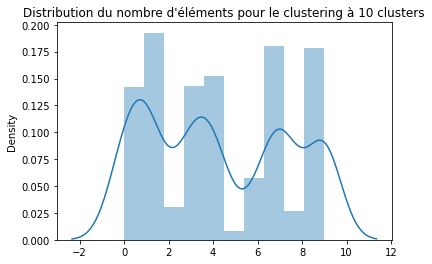

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


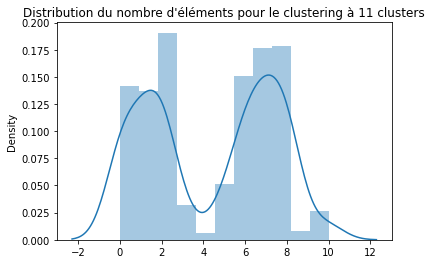

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


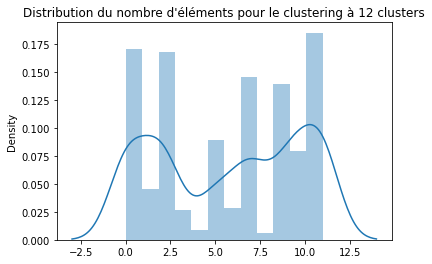

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


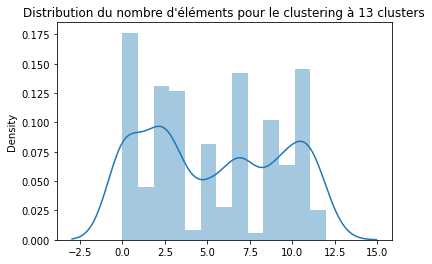

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


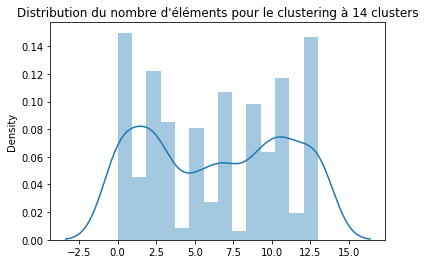

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


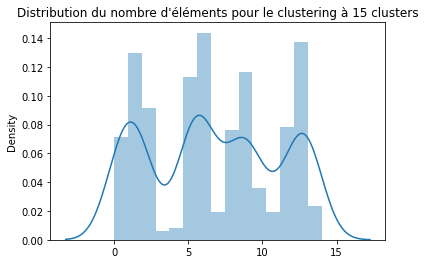

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


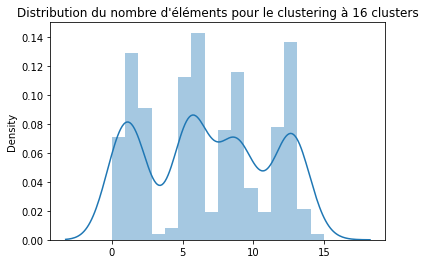

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


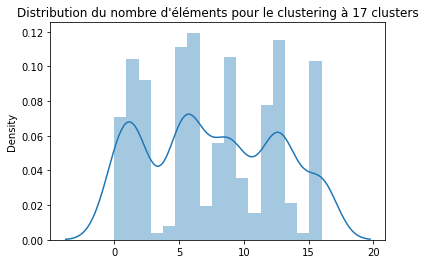

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


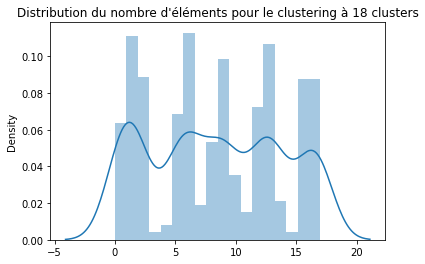

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


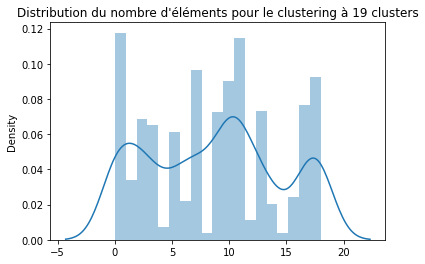

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


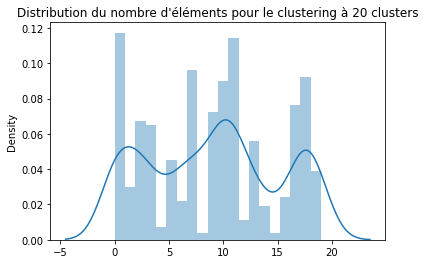

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


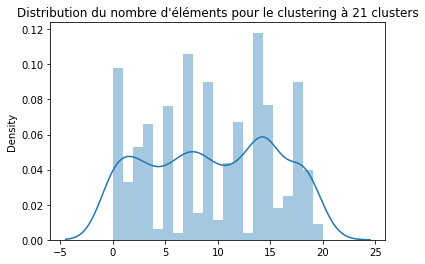

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


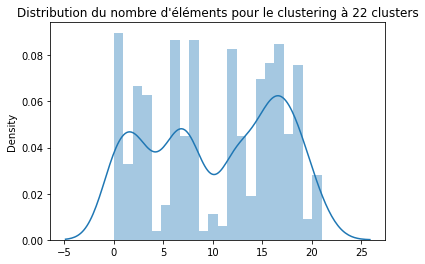

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


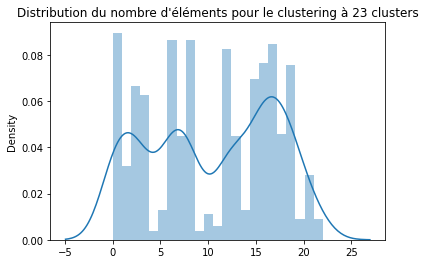

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


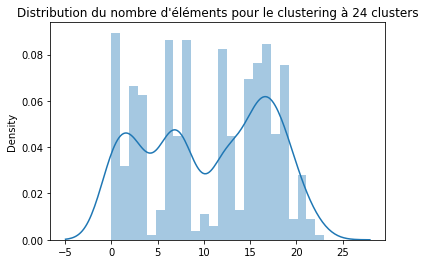

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


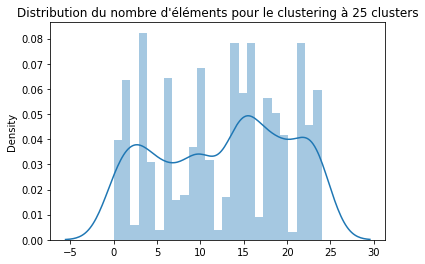

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


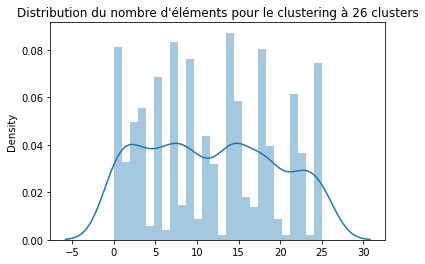

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


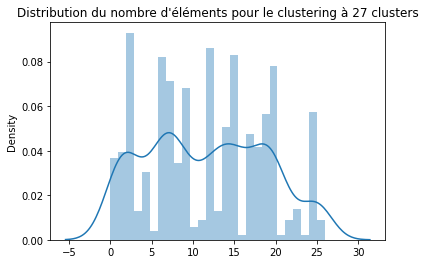

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


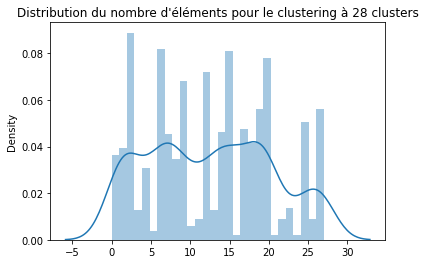

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


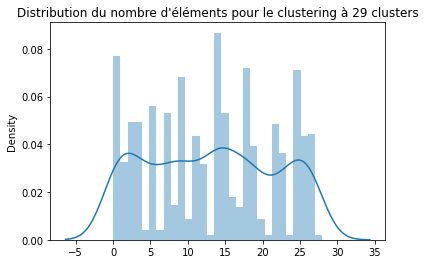

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


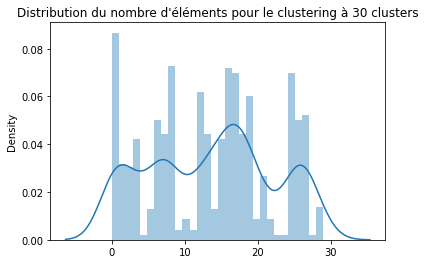

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


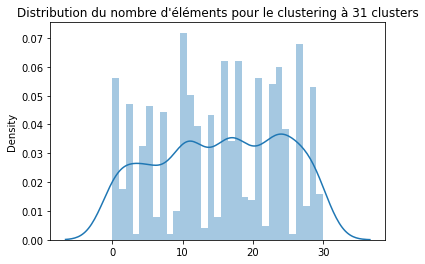

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


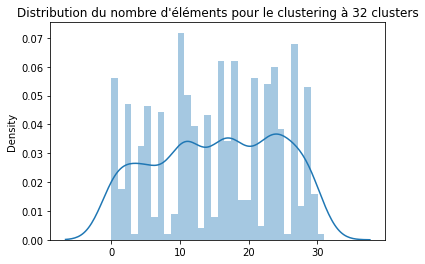

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


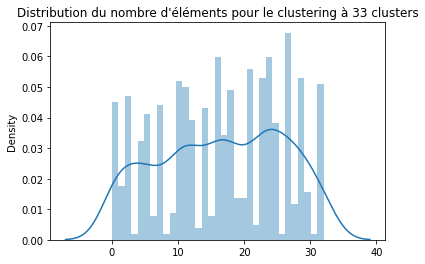

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


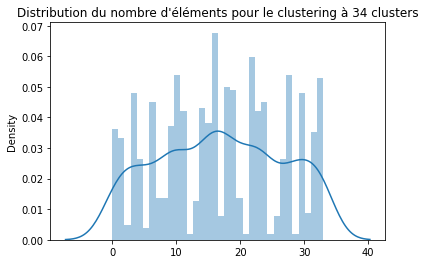

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


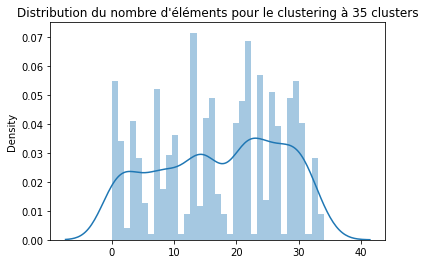

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


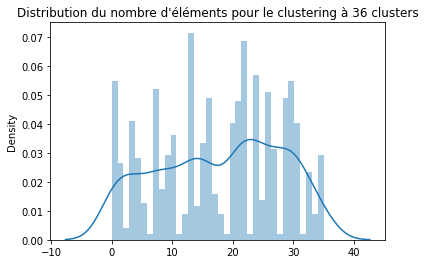

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


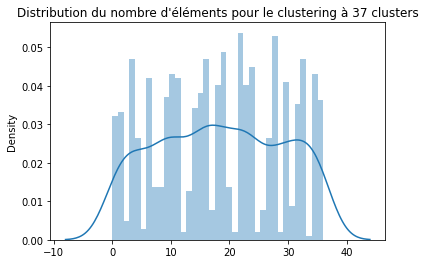

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


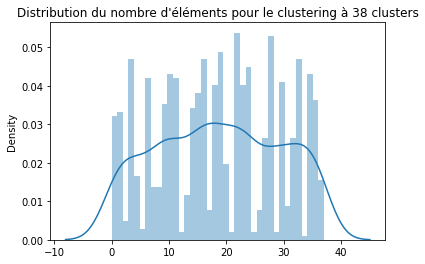

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


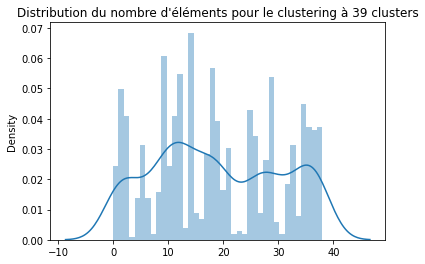

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


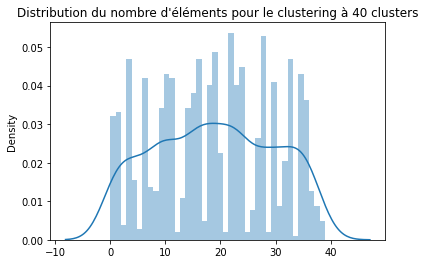

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


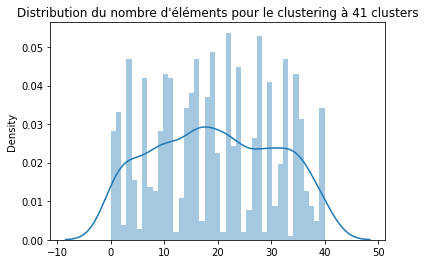

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


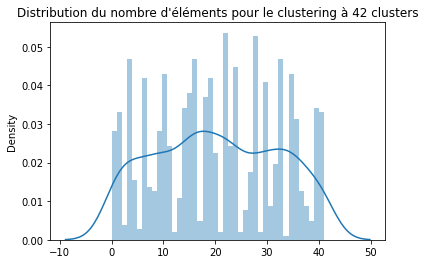

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


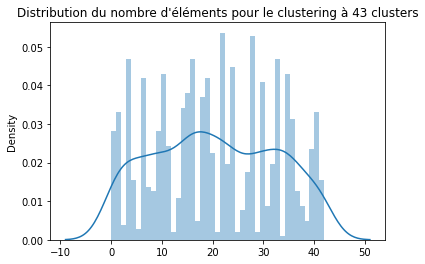

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


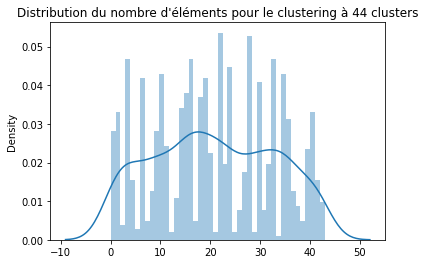

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


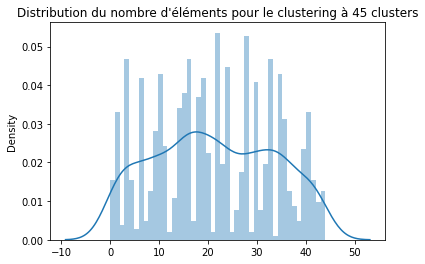

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


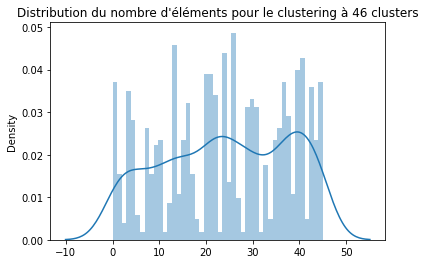

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


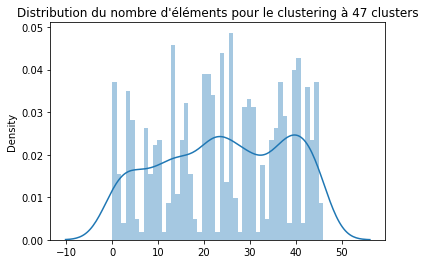

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


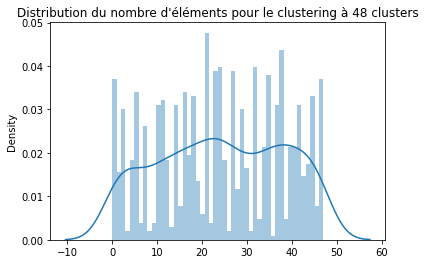

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


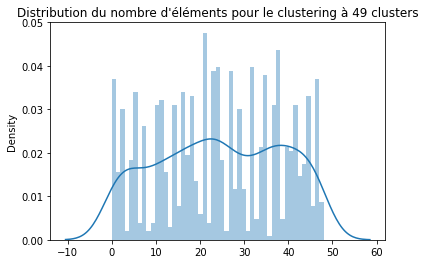

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


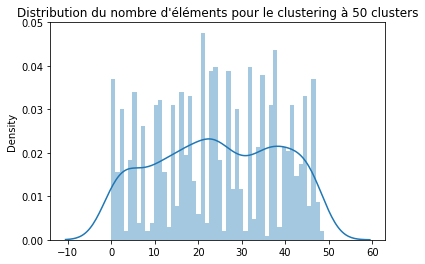

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


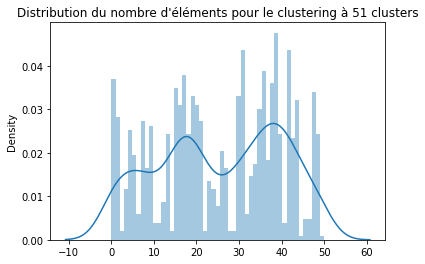

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


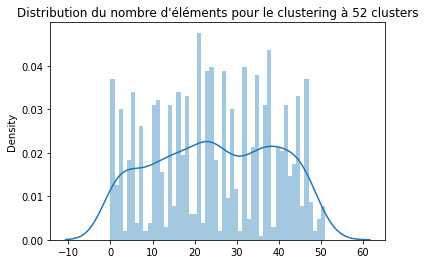

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


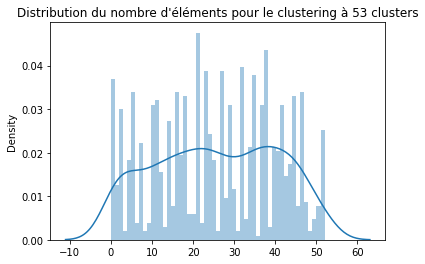

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


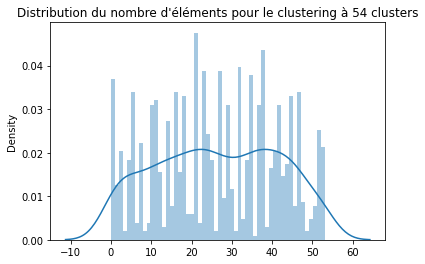

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


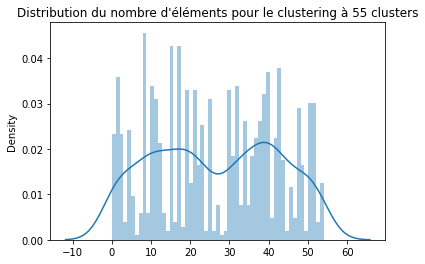

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


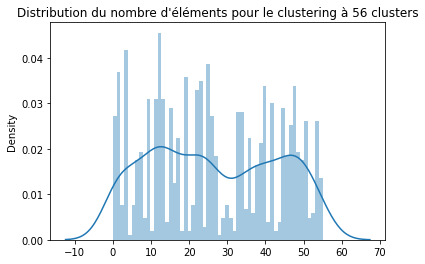

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


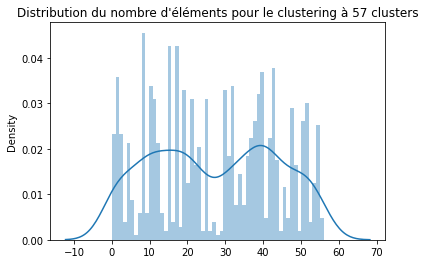

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


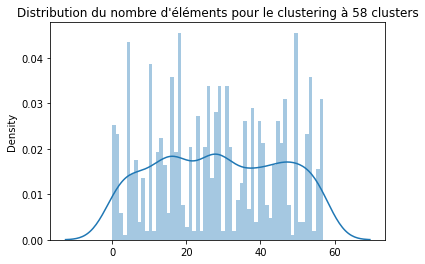

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


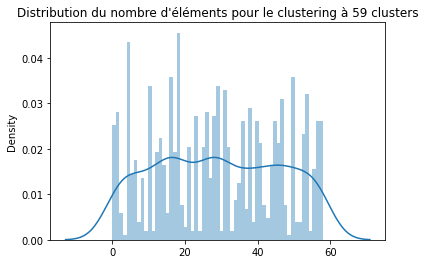

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


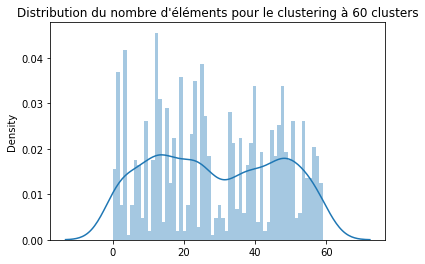

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


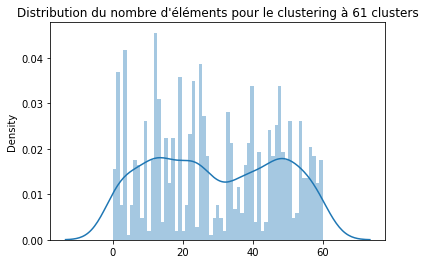

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


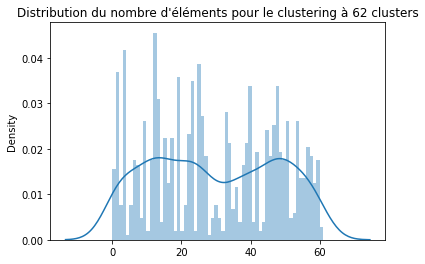

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


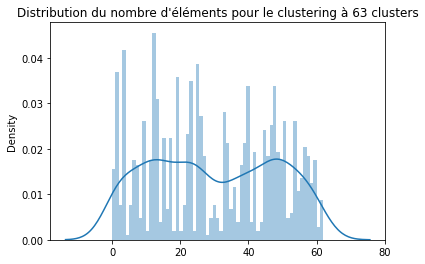

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


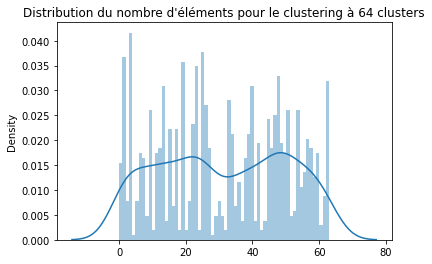

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


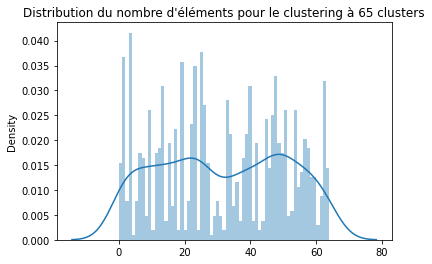

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


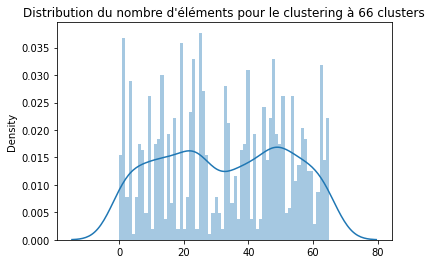

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


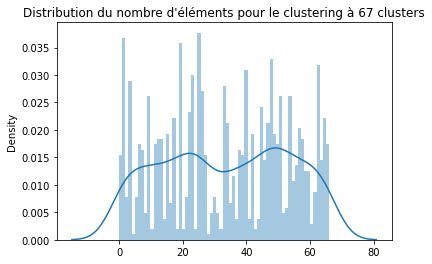

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


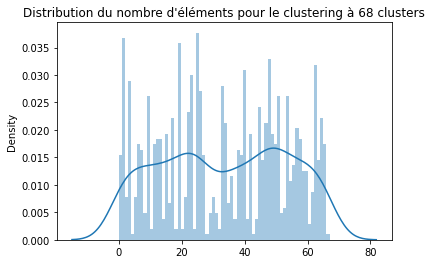

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


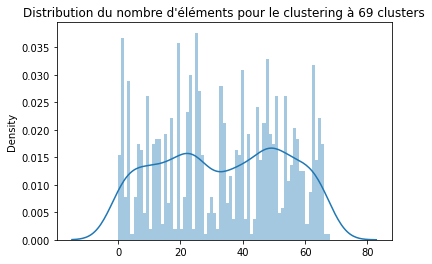

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


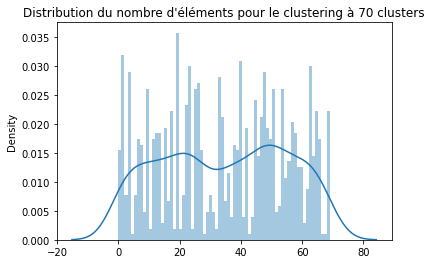

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


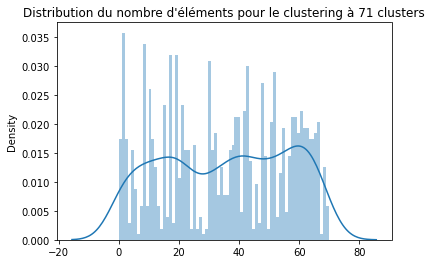

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


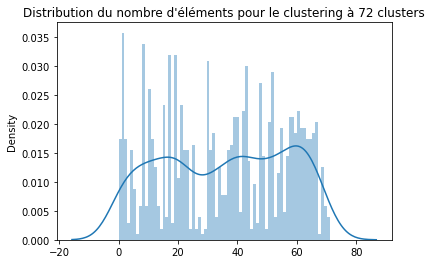

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


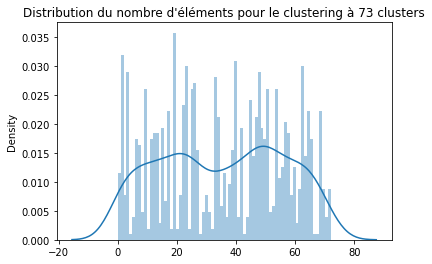

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


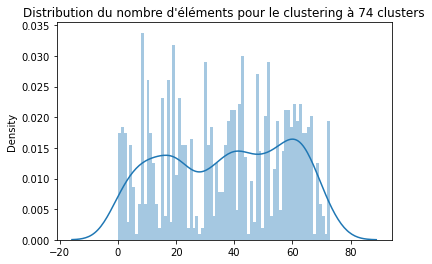

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


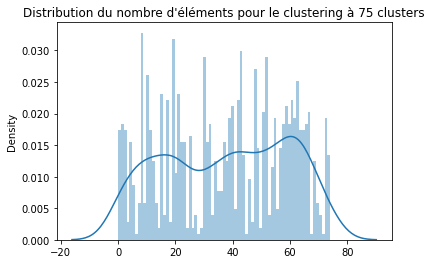

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


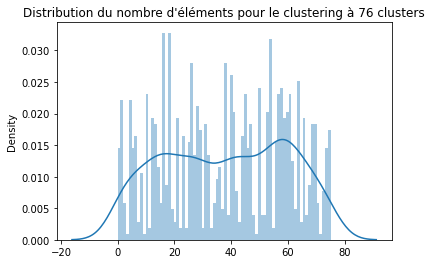

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


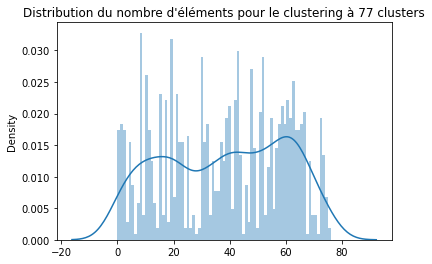

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


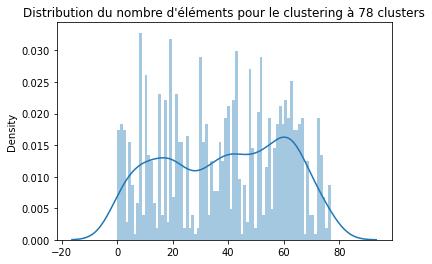

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


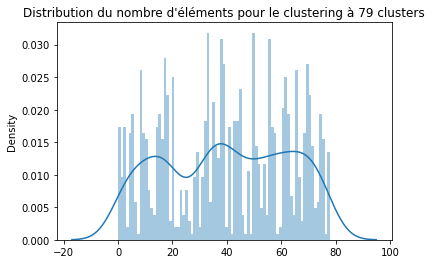

In [267]:
%matplotlib inline
for i in range(2,max_clusters):
    plt.figure()
    titre = 'Distribution du nombre d\'éléments pour le clustering à '+ str(i)+ ' clusters'
    plt.title(titre)
    sns.distplot(dict_kmeans[i].labels_, bins=i)
    plt.show()

Prenons le Kmeans avec 18 clusters

In [268]:
jeu_categoriel = pd.DataFrame(X_NLP)
jeu_categoriel['label'] = dict_kmeans[10].labels_

In [269]:
jeu_categoriel.to_csv('data_saved_jeu_complet_kmeans.csv')

In [270]:
jeu_categoriel.shape

(1050, 341)

## Représentation des données

In [271]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2)
T = tsne.fit_transform(X_combined.copy())

<AxesSubplot:title={'center':'Représentation du jeu de données via T-SNE'}>

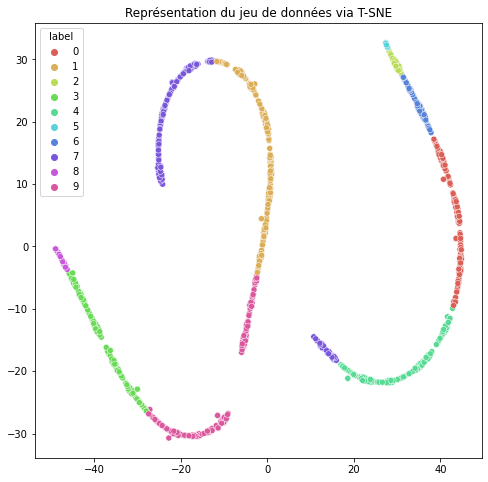

In [272]:
plt.figure(figsize=(8,8))
plt.title('Représentation du jeu de données via T-SNE')
palette_sns = sns.color_palette("hls", jeu_categoriel['label'].nunique())
sns.scatterplot(x= T[:,0], 
                y= T[:,1], 
                hue= jeu_categoriel['label'], 
                palette= palette_sns)

In [273]:
T.shape

(1050, 2)

In [274]:
X_combined.shape

(1050, 404)

In [275]:
data_final = pd.concat([train, test])
data_final['X_TSNE'] = T[:,0]
data_final['Y_TSNE'] = T[:,1]

In [276]:
data_final.set_index('Unnamed: 0', inplace=True)

In [277]:
data_final['label'] = jeu_categoriel['label'].tolist()

In [278]:
data_final.shape

(1050, 20)

In [279]:
data_final.to_csv('data_saved_data_final.csv')

In [280]:
data_final.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3,X_TSNE,Y_TSNE,label
Unnamed: 0,,,,,,,,,,,,,,,,,,,,
165,785b4383b12106dd172306d427d8f7b2,2015-12-01 12:40:44 +0000,http://www.flipkart.com/rockmantra-cute-two-ca...,Rockmantra Cute Two Cats Ceramic Mug,MUGEAGGKFBTYPN4Z,499.0,349.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,False,Rockmantra Cute Two Cats Ceramic Mug (5.5 l)\r...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va...",Kitchen & Dining,Coffee Mugs,Rockmantra Coffee Mugs,33.129463,25.154003,6
248,45d0af2c709de47268c80c35a117de44,2015-12-01 12:40:44 +0000,http://www.flipkart.com/malhar-niko-male-doll-...,Malhar Niko Male Doll Showpiece - 25 cm,SHIEY382SR75SXEY,6395.0,5436.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,True,Buy Malhar Niko Male Doll Showpiece - 25 cm ...,No rating available,No rating available,Malhar,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Decor & Festive Needs,Showpieces,Malhar Showpieces,-6.155583,28.126665,1
310,64b463dc0b75ae40a848498c657041e6,2015-12-01 06:13:00 +0000,http://www.flipkart.com/linksys-smart-wi-fi-ro...,Linksys Smart Wi-Fi Router,RTRDZTF9DBT4CW8U,14999.0,13500.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,True,Buy Linksys Smart Wi-Fi Router only for Rs. 0....,No rating available,No rating available,Linksys,"{""product_specification""=>[{""key""=>""Encryption...",Computers,Network Components,Routers,30.580425,28.626501,2
685,6b5cdfe68595fbcab0e05dc625d3d66a,2015-12-31 09:19:31 +0000,http://www.flipkart.com/richfeel-sunshield-spf...,Richfeel Sunshield - SPF 30 PA++,SNRE4F2GBWVF6UKR,299.0,224.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,False,Flipkart.com: Buy Richfeel Sunshield - SPF 30 ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Quantity"",...",Beauty and Personal Care,Body and Skin Care,Face Care,35.914146,-18.443581,4
843,e86daf9ebcdfc5c5dd088cdb7f8f8db6,2015-12-29 05:07:38 +0000,http://www.flipkart.com/epresent-mfan-1-fan-us...,Epresent Mfan 1 Fan USB USB Fan,USGEB3HTYWCYT2HY,269.0,219.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,False,Buy Epresent Mfan 1 Fan USB USB Fan for Rs.219...,No rating available,No rating available,Epresent,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Computers,Laptop Accessories,USB Gadgets,34.760456,22.353014,6


# Import données

In [281]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [282]:
import glob
glob.glob('data_saved/*')

[]

In [283]:
data = pd.read_csv('data_saved_data_final.csv')

In [284]:
data.head()

,Unnamed: 0,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3,X_TSNE,Y_TSNE,label
0,165,785b4383b12106dd172306d427d8f7b2,2015-12-01 12:40:44 +0000,http://www.flipkart.com/rockmantra-cute-two-ca...,Rockmantra Cute Two Cats Ceramic Mug,MUGEAGGKFBTYPN4Z,499.0,349.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,False,...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va...",Kitchen & Dining,Coffee Mugs,Rockmantra Coffee Mugs,33.129463,25.154003,6
1,248,45d0af2c709de47268c80c35a117de44,2015-12-01 12:40:44 +0000,http://www.flipkart.com/malhar-niko-male-doll-...,Malhar Niko Male Doll Showpiece - 25 cm,SHIEY382SR75SXEY,6395.0,5436.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,True,...,No rating available,No rating available,Malhar,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Decor & Festive Needs,Showpieces,Malhar Showpieces,-6.155583,28.126665,1
2,310,64b463dc0b75ae40a848498c657041e6,2015-12-01 06:13:00 +0000,http://www.flipkart.com/linksys-smart-wi-fi-ro...,Linksys Smart Wi-Fi Router,RTRDZTF9DBT4CW8U,14999.0,13500.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,True,...,No rating available,No rating available,Linksys,"{""product_specification""=>[{""key""=>""Encryption...",Computers,Network Components,Routers,30.580425,28.626501,2
3,685,6b5cdfe68595fbcab0e05dc625d3d66a,2015-12-31 09:19:31 +0000,http://www.flipkart.com/richfeel-sunshield-spf...,Richfeel Sunshield - SPF 30 PA++,SNRE4F2GBWVF6UKR,299.0,224.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,False,...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Quantity"",...",Beauty and Personal Care,Body and Skin Care,Face Care,35.914146,-18.443580,4
4,843,e86daf9ebcdfc5c5dd088cdb7f8f8db6,2015-12-29 05:07:38 +0000,http://www.flipkart.com/epresent-mfan-1-fan-us...,Epresent Mfan 1 Fan USB USB Fan,USGEB3HTYWCYT2HY,269.0,219.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,False,...,No rating available,No rating available,Epresent,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Computers,Laptop Accessories,USB Gadgets,34.760456,22.353014,6


# Taille des images pour visualisation

In [285]:
import cv2

def resize(img_filename, height):
    original_path = '/kaggle/input/dataset-flipkart/Flipkart/Images/'
    final_path = '/kaggle/input/dataset-flipkart/Flipkart/Resized_Images/'
    if 'Images/' in img_filename:
        img_filename = img_filename.split("Images/")[1]
    
    #chargement image
    img = cv2.imread(original_path + str(img_filename), cv2.IMREAD_UNCHANGED)
    
    #proportions de l'image
    ratio = img.shape[0]/img.shape[1]
    width = int(height / ratio)
    
    #recadrer image
    resized = cv2.resize(img, (width, height), interpolation = cv2.INTER_AREA)
    
    #save image
    cv2.imwrite(str(final_path) + str(img_filename), resized)
    del width, img, ratio 
    return True

In [286]:
if False:
    from ipywidgets import IntProgress

    f = IntProgress(min=0, max=len(data['image'].tolist())) # instantiate the bar
    display(f) # display the bar
    k=0
    for image in data['image'].tolist():
        resize(image, height=150)
        k+=1
        f.value = k # signal to increment the progress bar

# Visualisation 

## Graphe fixe

In [287]:
data.head(1)

,Unnamed: 0,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3,X_TSNE,Y_TSNE,label
0,165,785b4383b12106dd172306d427d8f7b2,2015-12-01 12:40:44 +0000,http://www.flipkart.com/rockmantra-cute-two-ca...,Rockmantra Cute Two Cats Ceramic Mug,MUGEAGGKFBTYPN4Z,499.0,349.0,/kaggle/input/dataset-flipkart/Flipkart/Images...,False,...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va...",Kitchen & Dining,Coffee Mugs,Rockmantra Coffee Mugs,33.129463,25.154003,6


In [288]:
data['retail_price'].describe()

count      1049.000000
mean       2186.197331
std        7639.229411
min          35.000000
25%         555.000000
50%         999.000000
75%        1999.000000
max      201000.000000
Name: retail_price, dtype: float64

In [289]:
data['price_as_size'] = pd.qcut(data['retail_price'], 8, labels = [3,4,5,6,7,8,9,10])

In [290]:
data['image'] = data['image'].apply([lambda x : str(x).split('/Images/')[1]])

In [291]:
from bokeh.plotting import figure, output_file, show, ColumnDataSource
from bokeh.models.tools import HoverTool
from bokeh.models import CategoricalColorMapper
from bokeh.transform import factor_cmap, factor_mark
from bokeh.palettes import Category20 as palette
from bokeh.transform import linear_cmap
from bokeh.models import  ColumnDataSource,Range1d, LabelSet, Label

In [292]:
data['label_string'] = data['label'].apply(lambda x : 'cat_'+ str(x))
liste_categories = tuple([str(x) for x in data['label_string'].unique().tolist()])
palette_sns = sns.color_palette("hls", len(liste_categories))

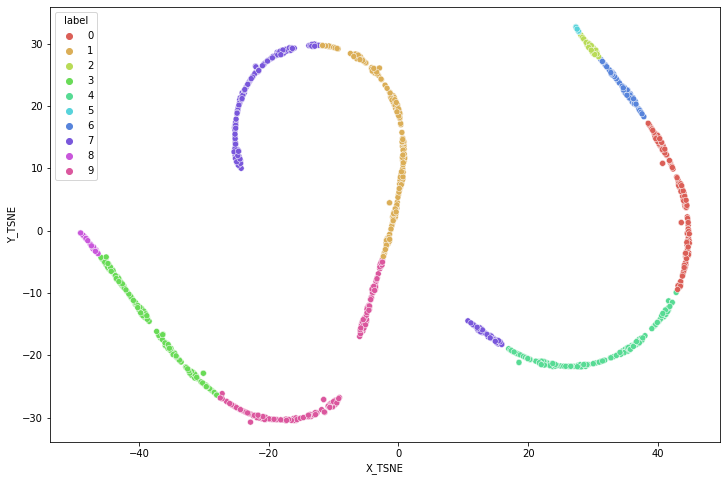

In [293]:
plt.figure(figsize=(12,8))
plt.title('')
sns.scatterplot(x = data['X_TSNE'],
               y= data['Y_TSNE'],
               hue = data['label'], 
                palette = palette_sns, 
                legend='full')
plt.show()

## Graphe interactif

In [294]:
palette[len(liste_categories)]

('#1f77b4',
 '#aec7e8',
 '#ff7f0e',
 '#ffbb78',
 '#2ca02c',
 '#98df8a',
 '#d62728',
 '#ff9896',
 '#9467bd',
 '#c5b0d5')

In [295]:
%matplotlib inline
from bokeh.plotting import ColumnDataSource, figure, output_file, show
#create ColumnDataSource from dataframe
source = ColumnDataSource(data)
# allows visualisation in notebook

from bokeh.io import output_notebook

from bokeh.resources import INLINE

output_notebook(INLINE)




# add plot
p = figure(
    title='Représentation de la catégorisation du jeu de données après traitement',
    #tools='',
    x_axis_label = 'TSNE X axis',
    y_axis_label = 'TSNE Y axis',
    plot_width=1400, 
    plot_height=800
)


colors = {}
for label, color in zip(data['label_string'].unique().tolist(), palette[len(liste_categories)]):
    colors[label] = color
    
color_map = CategoricalColorMapper(factors = list(colors.keys()),palette=palette[len(liste_categories)])

# render glyph
p.scatter(x='X_TSNE',
          y='Y_TSNE',
          legend_label='label_string',
          line_color = None,
          #fill_color= colors,
          #fill_color = colors,
          color = {'field': 'label_string', 'transform': color_map},
          source=source,
          size='price_as_size',
          line_width = 2,
)
        

# add text
if False:
    labels = LabelSet(x='X_TSNE', y='Y_TSNE', text='label', level='glyph',text_font_size='7pt',
                      x_offset=5, y_offset=5, source=source, render_mode='canvas')
    p.add_layout(labels)

#add tooltips
hover = HoverTool()
hover.tooltips = """
    <div>
        <div><b>@product_name</b></div>
        <div><b>@cat_lvl_2</b></div>
        </div>Kmeans Category : @label_string</div> 
        <div><img src="data/Resized_Images/@image", alt='categorie' /></div>
    </div>"""
p.add_tools(hover)
show(p)

Loading BokehJS ...

In [296]:
%matplotlib inline
show(p)
